# Data

In [491]:
import pandas as pd
import os
import glob
import webbrowser

def load_most_recent_csv(folder_path):
    # Use glob to find all CSV files in the specified folder
    csv_files = glob.glob(os.path.join(folder_path, '*.csv'))
    
    # Get the most recent file based on the modification time
    if csv_files:
        latest_file = max(csv_files, key=os.path.getmtime)
        print(f"Loading the most recent file: {latest_file}")
        return pd.read_csv(latest_file)
    else:
        print("No CSV files found in the specified folder.")
        return None

In [492]:
folder_path = '../data'
data = load_most_recent_csv(folder_path)
print(data)

Loading the most recent file: ../data\data_bank_trx.csv
      profile   name  surname  birth_date        dni  \
0     buyer_1  Aitor    López  1996-08-10  06980792Q   
1     buyer_1  Aitor    López  1996-08-10  06980792Q   
2     buyer_1  Aitor    López  1996-08-10  06980792Q   
3     buyer_1  Aitor    López  1996-08-10  06980792Q   
4     buyer_1  Aitor    López  1996-08-10  06980792Q   
...       ...    ...      ...         ...        ...   
9083  buyer_8  Patxi  Urrutia  1979-04-04  09752612Z   
9084  buyer_8  Patxi  Urrutia  1979-04-04  09752612Z   
9085  buyer_8  Patxi  Urrutia  1979-04-04  09752612Z   
9086  buyer_8  Patxi  Urrutia  1979-04-04  09752612Z   
9087  buyer_8  Patxi  Urrutia  1979-04-04  09752612Z   

                                email  password                    iban  \
0          aitor.lopez@smartpixel.com    628678  ES27209522028598818380   
1          aitor.lopez@smartpixel.com    628678  ES27209522028598818380   
2          aitor.lopez@smartpixel.com    62867

In [493]:
pd.DataFrame(data)

,profile,name,surname,birth_date,dni,email,password,iban,assets,trx_date,trx_city,trx_type,trx_cat,trx_amount,balance
0,buyer_1,Aitor,López,1996-08-10,06980792Q,aitor.lopez@smartpixel.com,628678,ES27209522028598818380,3314.42,2022-01-01T18:47:44,Bilbao,incomes,salary,2977.38,6291.80
1,buyer_1,Aitor,López,1996-08-10,06980792Q,aitor.lopez@smartpixel.com,628678,ES27209522028598818380,3314.42,2022-01-01T14:07:19,Bilbao,expenses,leisure,-69.13,6222.67
2,buyer_1,Aitor,López,1996-08-10,06980792Q,aitor.lopez@smartpixel.com,628678,ES27209522028598818380,3314.42,2022-01-01T18:28:59,Bilbao,expenses,cash,-100.00,6122.67
3,buyer_1,Aitor,López,1996-08-10,06980792Q,aitor.lopez@smartpixel.com,628678,ES27209522028598818380,3314.42,2022-01-02T14:07:37,Bilbao,expenses,transport,-64.16,6058.51
4,buyer_1,Aitor,López,1996-08-10,06980792Q,aitor.lopez@smartpixel.com,628678,ES27209522028598818380,3314.42,2022-01-04T10:18:55,Bilbao,expenses,food,-109.49,5949.02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9083,buyer_8,Patxi,Urrutia,1979-04-04,09752612Z,patxi.urrutia@extremeweb.online,628514,ES32209545265259276199,1854.06,2024-10-08T10:16:10,Durango,expenses,transport,-80.06,-68964.17
9084,buyer_8,Patxi,Urrutia,1979-04-04,09752612Z,patxi.urrutia@extremeweb.online,628514,ES32209545265259276199,1854.06,2024-10-08T09:07:41,Durango,expenses,leisure,-22.70,-68986.87
9085,buyer_8,Patxi,Urrutia,1979-04-04,09752612Z,patxi.urrutia@extremeweb.online,628514,ES32209545265259276199,1854.06,2024-10-08T18:32:10,Durango,expenses,repairs,-86.50,-69073.37
9086,buyer_8,Patxi,Urrutia,1979-04-04,09752612Z,patxi.urrutia@extremeweb.online,628514,ES32209545265259276199,1854.06,2024-10-09T15:29:36,Durango,expenses,cash,-100.00,-69173.37


In [494]:
print(data.columns)

Index(['profile', 'name', 'surname', 'birth_date', 'dni', 'email', 'password',
       'iban', 'assets', 'trx_date', 'trx_city', 'trx_type', 'trx_cat',
       'trx_amount', 'balance'],
      dtype='object')


### Número de filas de cada columna

In [495]:
filtered_rows = data[(data['name'] == 'Aitor') & (data['surname'] == 'López')]
num_rows = filtered_rows.shape[0]
print(f"El número de filas con nombre 'Aitor' y apellido 'López' es: {num_rows}")

El número de filas con nombre 'Aitor' y apellido 'López' es: 1171


## Predicciones de cada uno de ahorro, gastos e ingresos.

### Primero escalo las variables que lo necesitan:

In [481]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Variables a escalar
scaling_columns = ['assets', 'trx_amount', 'balance']

scaler = StandardScaler()

data[scaling_columns] = scaler.fit_transform(data[scaling_columns])

df = data.copy() 
print(df.head())


   profile   name surname  birth_date        dni                       email  \
0  buyer_1  Aitor   López  1996-08-10  06980792Q  aitor.lopez@smartpixel.com   
1  buyer_1  Aitor   López  1996-08-10  06980792Q  aitor.lopez@smartpixel.com   
2  buyer_1  Aitor   López  1996-08-10  06980792Q  aitor.lopez@smartpixel.com   
3  buyer_1  Aitor   López  1996-08-10  06980792Q  aitor.lopez@smartpixel.com   
4  buyer_1  Aitor   López  1996-08-10  06980792Q  aitor.lopez@smartpixel.com   

   password                    iban  assets             trx_date trx_city  \
0    628678  ES27209522028598818380  -0.313  2022-01-01T18:47:44   Bilbao   
1    628678  ES27209522028598818380  -0.313  2022-01-01T14:07:19   Bilbao   
2    628678  ES27209522028598818380  -0.313  2022-01-01T18:28:59   Bilbao   
3    628678  ES27209522028598818380  -0.313  2022-01-02T14:07:37   Bilbao   
4    628678  ES27209522028598818380  -0.313  2022-01-04T10:18:55   Bilbao   

   trx_type    trx_cat  trx_amount   balance  
0   incom

## Ver datos de Aitxiber Beitia

In [482]:
aitxiber_beitia_df = df[(df['name'] == 'Aitxiber') & (df['surname'] == 'Beitia')]

print(aitxiber_beitia_df)

      profile      name surname  birth_date        dni  \
1171  buyer_2  Aitxiber  Beitia  1984-09-05  92984002Q   
1172  buyer_2  Aitxiber  Beitia  1984-09-05  92984002Q   
1173  buyer_2  Aitxiber  Beitia  1984-09-05  92984002Q   
1174  buyer_2  Aitxiber  Beitia  1984-09-05  92984002Q   
1175  buyer_2  Aitxiber  Beitia  1984-09-05  92984002Q   
...       ...       ...     ...         ...        ...   
2319  buyer_2  Aitxiber  Beitia  1984-09-05  92984002Q   
2320  buyer_2  Aitxiber  Beitia  1984-09-05  92984002Q   
2321  buyer_2  Aitxiber  Beitia  1984-09-05  92984002Q   
2322  buyer_2  Aitxiber  Beitia  1984-09-05  92984002Q   
2323  buyer_2  Aitxiber  Beitia  1984-09-05  92984002Q   

                               email  password                    iban  \
1171  aitxiber.beitia@extremeweb.net    166434  ES51209545001486028444   
1172  aitxiber.beitia@extremeweb.net    166434  ES51209545001486028444   
1173  aitxiber.beitia@extremeweb.net    166434  ES51209545001486028444   
1174  a

# Predicciones con ARIMA para cada uno

Datos de Aitor López:
         incomes   expenses
count  34.000000  34.000000
mean    6.077040  -5.989069
std     1.447673   1.933944
min     5.112030 -10.270583
25%     5.221899  -7.000845
50%     5.386577  -5.457508
75%     6.239032  -4.811595
max     9.871036  -2.958710
Número de datos para Aitor López: 34
     trx_date  income_forecast  expense_forecast  savings_forecast
34 2024-11-30         6.193114         -5.512592         11.705706
35 2024-12-31         6.094662         -5.869709         11.964370
36 2025-01-31         6.106680         -5.924383         12.031063
37 2025-02-28         6.105213         -5.932754         12.037966
38 2025-03-31         6.105392         -5.934035         12.039427
39 2025-04-30         6.105370         -5.934231         12.039601
40 2025-05-31         6.105373         -5.934261         12.039634
41 2025-06-30         6.105372         -5.934266         12.039638
42 2025-07-31         6.105372         -5.934267         12.039639
43 2025-08-31      

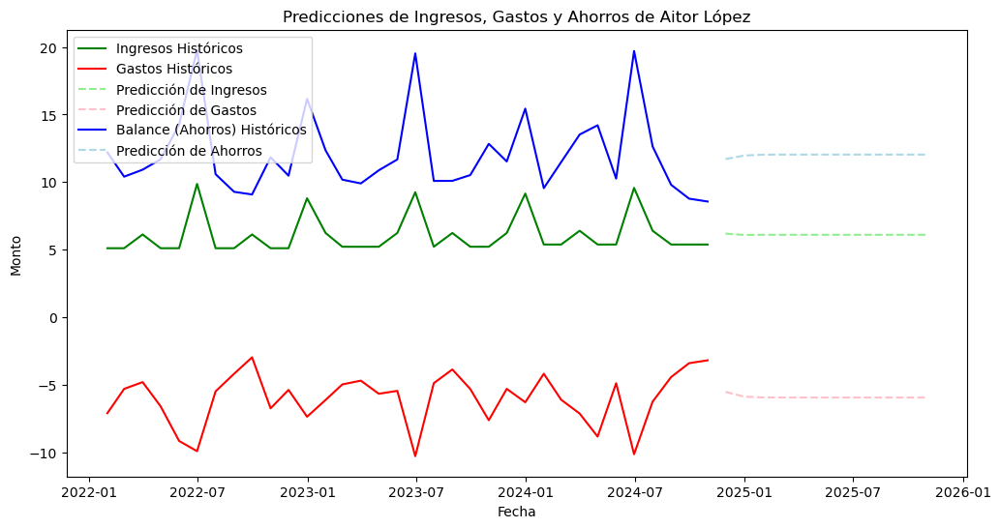

Datos de Aitxiber Beitia:
         incomes   expenses
count  34.000000  34.000000
mean    4.110413  -5.177838
std     1.025865   1.488099
min     3.446192  -8.639293
25%     3.516741  -6.131666
50%     3.593072  -5.292348
75%     4.232884  -4.074750
max     6.957146  -2.719659
Número de datos para Aitxiber Beitia: 34
     trx_date  income_forecast  expense_forecast  savings_forecast
34 2024-11-30         4.259790         -5.625643          9.885434
35 2024-12-31         4.098113         -5.098161          9.196275
36 2025-01-31         4.137319         -5.196438          9.333758
37 2025-02-28         4.127812         -5.178128          9.305940
38 2025-03-31         4.130118         -5.181539          9.311657
39 2025-04-30         4.129558         -5.180904          9.310462
40 2025-05-31         4.129694         -5.181022          9.310716
41 2025-06-30         4.129661         -5.181000          9.310661
42 2025-07-31         4.129669         -5.181004          9.310673
43 2025-08-

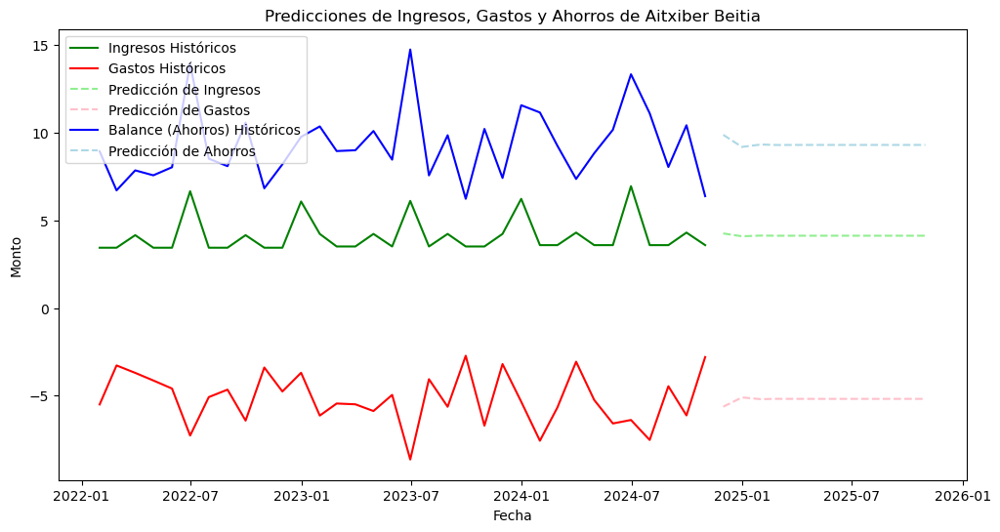

Datos de Ana Etxebarria:
         incomes   expenses
count  34.000000  34.000000
mean   12.041471  -9.664829
std     2.899286   3.566851
min    10.375339 -21.350410
25%    10.586600 -10.040690
50%    10.914439  -8.407091
75%    11.522768  -7.805931
max    19.428403  -6.947220
Número de datos para Ana Etxebarria: 34
     trx_date  income_forecast  expense_forecast  savings_forecast
34 2024-11-30        12.128878         -9.861258         21.990136
35 2024-12-31        12.076625         -9.693577         21.770203
36 2025-01-31        12.086437         -9.704095         21.790532
37 2025-02-28        12.084595         -9.703435         21.788030
38 2025-03-31        12.084941         -9.703477         21.788417
39 2025-04-30        12.084876         -9.703474         21.788350
40 2025-05-31        12.084888         -9.703474         21.788362
41 2025-06-30        12.084886         -9.703474         21.788360
42 2025-07-31        12.084886         -9.703474         21.788360
43 2025-08-31

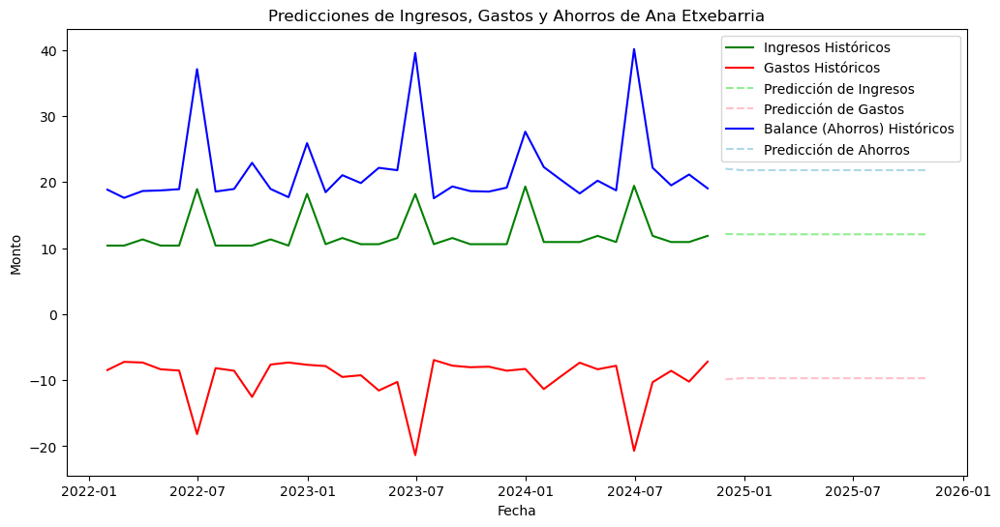

Datos de Marc Andreu:
         incomes   expenses
count  34.000000  34.000000
mean    4.159488  -5.702783
std     0.973250   1.805617
min     3.509461 -10.542327
25%     3.594690  -6.804967
50%     3.732520  -5.088029
75%     4.137862  -4.479830
max     6.621184  -3.146554
Número de datos para Marc Andreu: 34
     trx_date  income_forecast  expense_forecast  savings_forecast
34 2024-11-30         4.262588         -5.740798         10.003386
35 2024-12-31         4.162085         -5.749087          9.911172
36 2025-01-31         4.181140         -5.749129          9.930270
37 2025-02-28         4.177527         -5.749130          9.926657
38 2025-03-31         4.178212         -5.749130          9.927342
39 2025-04-30         4.178082         -5.749130          9.927212
40 2025-05-31         4.178107         -5.749130          9.927237
41 2025-06-30         4.178102         -5.749130          9.927232
42 2025-07-31         4.178103         -5.749130          9.927233
43 2025-08-31      

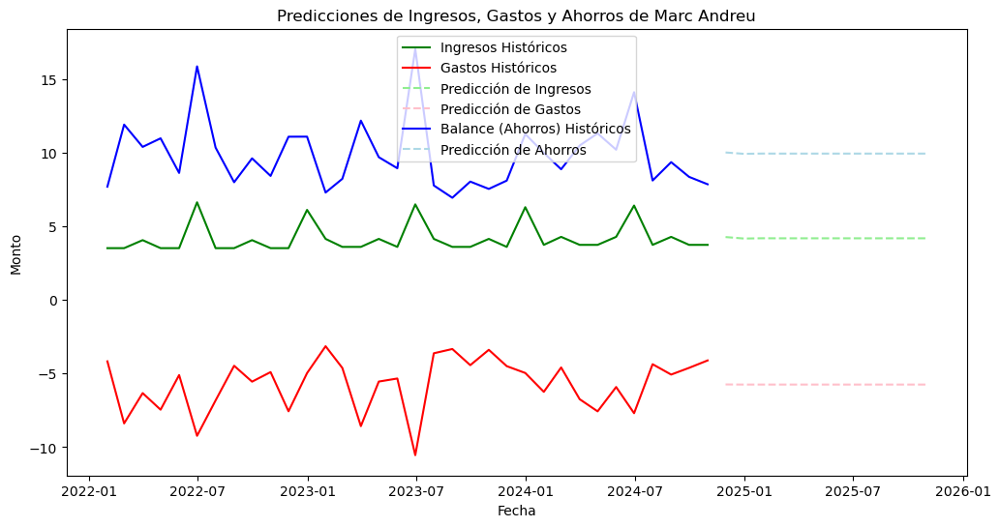

Datos de Sara Urkiaga:
         incomes   expenses
count  34.000000  34.000000
mean    8.578885  -7.215945
std     2.067268   2.279119
min     7.369091 -15.821058
25%     7.520404  -7.324015
50%     7.673166  -6.710743
75%     8.375168  -6.099258
max    14.280176  -4.522581
Número de datos para Sara Urkiaga: 34
     trx_date  income_forecast  expense_forecast  savings_forecast
34 2024-11-30         8.778743         -7.397311         16.176053
35 2024-12-31         8.585386         -7.237811         15.823197
36 2025-01-31         8.619202         -7.265193         15.884396
37 2025-02-28         8.613288         -7.260492         15.873780
38 2025-03-31         8.614322         -7.261300         15.875622
39 2025-04-30         8.614141         -7.261161         15.875302
40 2025-05-31         8.614173         -7.261185         15.875358
41 2025-06-30         8.614168         -7.261181         15.875348
42 2025-07-31         8.614169         -7.261181         15.875350
43 2025-08-31    

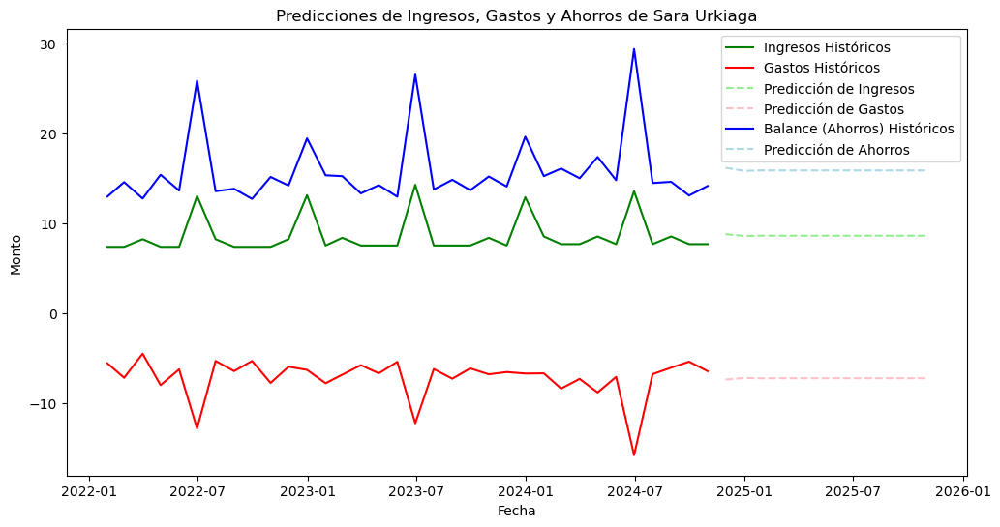

Datos de Manuel Díez:
         incomes   expenses
count  34.000000  34.000000
mean    4.853100  -5.380342
std     1.176327   1.853047
min     4.050280  -9.087562
25%     4.205469  -7.101364
50%     4.347849  -4.902063
75%     4.918476  -3.911601
max     7.798962  -2.502634
Número de datos para Manuel Díez: 34
     trx_date  income_forecast  expense_forecast  savings_forecast
34 2024-11-30         4.988306         -6.080548         11.068853
35 2024-12-31         4.851883         -5.187304         10.039188
36 2025-01-31         4.880942         -5.410307         10.291249
37 2025-02-28         4.874752         -5.354633         10.229386
38 2025-03-31         4.876071         -5.368532         10.244603
39 2025-04-30         4.875790         -5.365062         10.240853
40 2025-05-31         4.875850         -5.365929         10.241779
41 2025-06-30         4.875837         -5.365712         10.241550
42 2025-07-31         4.875840         -5.365766         10.241606
43 2025-08-31      

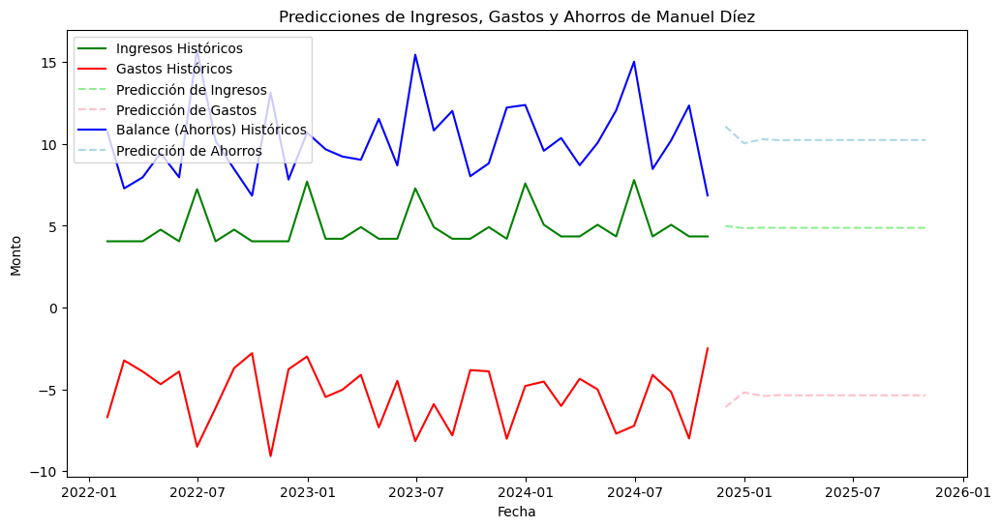

Datos de Agurtzane Laka:
         incomes   expenses
count  34.000000  34.000000
mean    2.686571  -2.858198
std     0.676221   1.014545
min     2.228292  -6.207127
25%     2.297139  -3.332802
50%     2.346301  -2.676196
75%     2.798885  -2.135781
max     4.535722  -1.060363
Número de datos para Agurtzane Laka: 34
     trx_date  income_forecast  expense_forecast  savings_forecast
34 2024-11-30         2.671277         -3.010650          5.681927
35 2024-12-31         2.702276         -2.836458          5.538733
36 2025-01-31         2.696840         -2.852016          5.548855
37 2025-02-28         2.697793         -2.850626          5.548419
38 2025-03-31         2.697626         -2.850750          5.548376
39 2025-04-30         2.697655         -2.850739          5.548394
40 2025-05-31         2.697650         -2.850740          5.548390
41 2025-06-30         2.697651         -2.850740          5.548391
42 2025-07-31         2.697651         -2.850740          5.548391
43 2025-08-31

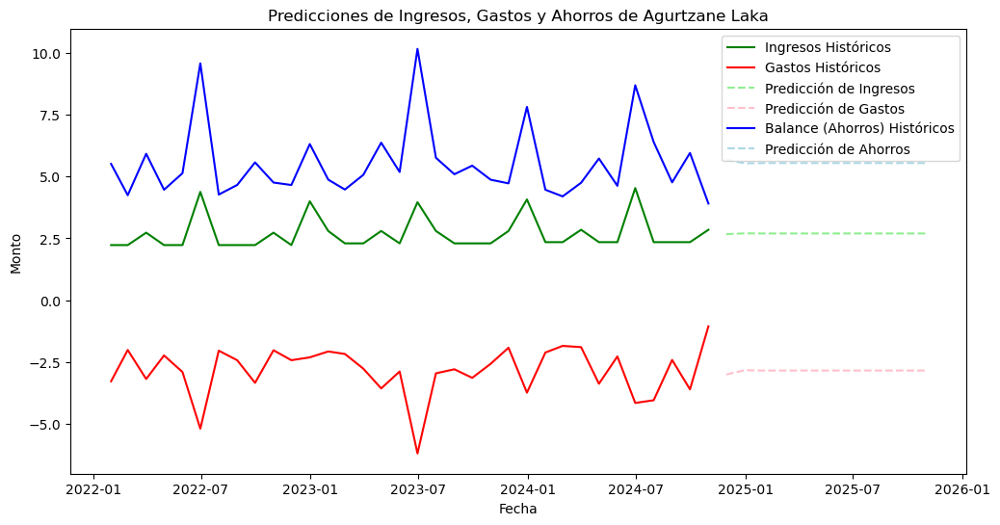

Datos de Patxi Urrutia:
         incomes   expenses
count  34.000000  34.000000
mean    4.202701  -4.720666
std     0.945647   1.235138
min     3.572797  -8.081171
25%     3.657133  -5.383819
50%     3.734036  -4.587820
75%     4.171671  -3.856780
max     6.526203  -2.557830
Número de datos para Patxi Urrutia: 34
     trx_date  income_forecast  expense_forecast  savings_forecast
34 2024-11-30         4.216892         -4.456779          8.673671
35 2024-12-31         4.220171         -4.671564          8.891735
36 2025-01-31         4.219832         -4.700159          8.919990
37 2025-02-28         4.219867         -4.703966          8.923832
38 2025-03-31         4.219863         -4.704472          8.924335
39 2025-04-30         4.219863         -4.704540          8.924403
40 2025-05-31         4.219863         -4.704549          8.924412
41 2025-06-30         4.219863         -4.704550          8.924413
42 2025-07-31         4.219863         -4.704550          8.924414
43 2025-08-31  

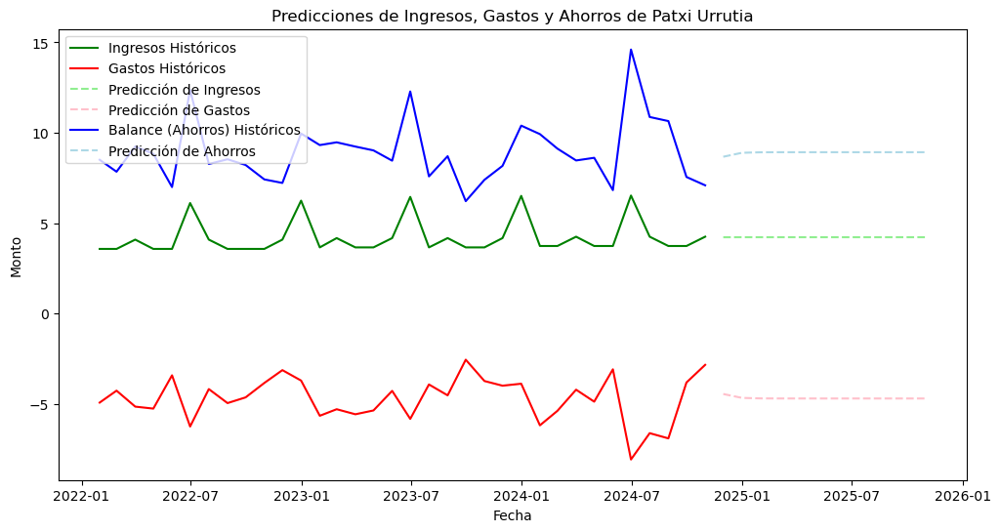

In [483]:
import pandas as pd
import numpy as np
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt

# Obtener los nombres y apellidos únicos. Iterar sobre cada uno
unique_persons = df[['name', 'surname']].drop_duplicates()
for index, person in unique_persons.iterrows():
    name, surname = person['name'], person['surname']
    
    # Filtrar los datos por 'name' y 'surname'
    person_df = df[(df['name'] == name) & (df['surname'] == surname)].copy()
    
    # Asegurarse de que la columna de fecha está en formato datetime
    person_df['trx_date'] = pd.to_datetime(person_df['trx_date'])
    
    # Crear columnas separadas para ingresos y gastos (usando 'trx_type' y 'trx_amount')
    person_df['incomes'] = person_df.apply(lambda x: x['trx_amount'] if x['trx_type'] == 'incomes' else 0, axis=1)
    person_df['expenses'] = person_df.apply(lambda x: x['trx_amount'] if x['trx_type'] == 'expenses' else 0, axis=1)
    
    # Convertir a periodo mensual usando 'trx_date' como índice
    person_df.set_index('trx_date', inplace=True)
    
    # Sumar ingresos y gastos mensuales
    monthly_person_df = person_df.resample('M').sum()
    monthly_person_df.fillna(0, inplace=True)
    
    # Crear un nuevo dfFrame solo con ingresos, gastos y balance
    monthly_person_df['balance'] = monthly_person_df['incomes'] - monthly_person_df['expenses']
    monthly_person_df.reset_index(inplace=True)
    
    # Verificar si hay suficientes datos y que no haya NaN
    print(f"Datos de {name} {surname}:")
    print(monthly_person_df[['incomes', 'expenses']].describe())
    monthly_person_df.dropna(subset=['incomes', 'expenses'], inplace=True)
    
    # Verificar la longitud de los datos
    print(f"Número de datos para {name} {surname}: {len(monthly_person_df['incomes'])}")
    
    if len(monthly_person_df['incomes']) > 0:
        # Ajustar un modelo ARIMA para ingresos
        model_income = ARIMA(monthly_person_df['incomes'], order=(1, 0, 0), enforce_stationarity=False, enforce_invertibility=False)
        model_income_fit = model_income.fit()

        # Hacer predicciones para los siguientes 12 meses
        income_forecast = model_income_fit.forecast(steps=12)

        # Ajustar un modelo ARIMA para gastos
        model_expense = ARIMA(monthly_person_df['expenses'], order=(1, 0, 0), enforce_stationarity=False, enforce_invertibility=False)
        model_expense_fit = model_expense.fit()

        # Hacer predicciones para los siguientes 12 meses
        expense_forecast = model_expense_fit.forecast(steps=12)

        # Crear un dfFrame para las predicciones
        forecast_index = pd.date_range(start=monthly_person_df['trx_date'].iloc[-1] + pd.DateOffset(months=1), periods=12, freq='M')
        forecast_df = pd.DataFrame({'trx_date': forecast_index, 'income_forecast': income_forecast, 'expense_forecast': expense_forecast})

        # Calcular ahorros (balance)
        forecast_df['savings_forecast'] = forecast_df['income_forecast'] - forecast_df['expense_forecast']
        print(forecast_df)
        plt.figure(figsize=(12, 6))
        plt.plot(monthly_person_df['trx_date'], monthly_person_df['incomes'], label='Ingresos Históricos', color='green')
        plt.plot(monthly_person_df['trx_date'], monthly_person_df['expenses'], label='Gastos Históricos', color='red')
        plt.plot(forecast_df['trx_date'], forecast_df['income_forecast'], label='Predicción de Ingresos', color='lightgreen', linestyle='--')
        plt.plot(forecast_df['trx_date'], forecast_df['expense_forecast'], label='Predicción de Gastos', color='pink', linestyle='--')
        plt.plot(monthly_person_df['trx_date'], monthly_person_df['balance'], label='Balance (Ahorros) Históricos', color='blue')
        plt.plot(forecast_df['trx_date'], forecast_df['savings_forecast'], label='Predicción de Ahorros', color='lightblue', linestyle='--')
        plt.title(f'Predicciones de Ingresos, Gastos y Ahorros de {name} {surname}')
        plt.xlabel('Fecha')
        plt.ylabel('Monto')
        plt.legend()
        plt.show()
    else:
        print(f"No hay suficientes datos para ajustar el modelo ARIMA para {name} {surname}.")

## Observar si en alguna de los gastos se pasa en algun momento

In [487]:
import pandas as pd

print(df.columns)
distinct_categories = df['trx_cat'].nunique()
print(f"Hay {distinct_categories} categorías distintas en trx_cat.")
unique_categories = df['trx_cat'].unique()
print("Categorías distintas en trx_cat:", unique_categories)

income_categories = df[df['trx_type'] == 'incomes']['trx_cat'].unique()
expense_categories = df[df['trx_type'] == 'expenses']['trx_cat'].unique()
income_categories_list = income_categories.tolist()
expense_categories_list = expense_categories.tolist()
print("Categorías de Ingresos:")
print(income_categories_list)
print("\nCategorías de Gastos:")
print(expense_categories_list)

Index(['profile', 'name', 'surname', 'birth_date', 'dni', 'email', 'password',
       'iban', 'assets', 'trx_date', 'trx_city', 'trx_type', 'trx_cat',
       'trx_amount', 'balance'],
      dtype='object')
Hay 27 categorías distintas en trx_cat.
Categorías distintas en trx_cat: ['salary' 'leisure' 'cash' 'transport' 'food' 'rent' 'water' 'gifts'
 'electricity' 'phone' 'education' 'clothing' 'repairs' 'travel'
 'appliances' 'car' 'healthcare' 'gas' 'extra_income' 'internet'
 'salary_bonus' 'taxes' 'insurance' 'mortgage' 'children' 'salary_partner'
 'salary_partner_bonus']
Categorías de Ingresos:
['salary', 'extra_income', 'salary_bonus', 'salary_partner', 'salary_partner_bonus']

Categorías de Gastos:
['leisure', 'cash', 'transport', 'food', 'rent', 'water', 'gifts', 'electricity', 'phone', 'education', 'clothing', 'repairs', 'travel', 'appliances', 'car', 'healthcare', 'gas', 'internet', 'taxes', 'insurance', 'mortgage', 'children']


In [473]:
print(data.columns)

Index(['profile', 'name', 'surname', 'birth_date', 'dni', 'email', 'password',
       'iban', 'assets', 'trx_date', 'trx_city', 'trx_type', 'trx_cat',
       'trx_amount', 'balance'],
      dtype='object')


# Gastos
#### 'leisure', 'cash', 'transport', 'food', 'rent', 'water', 'gifts', 'electricity', 'phone', 'education', 'clothing', 'repairs', 'travel', 'appliances', 'car', 'healthcare', 'gas', 'internet', 'taxes', 'insurance', 'mortgage', 'children'
## Gastos periódicos:
##### 'rent', 'water', 'electricity', 'phone', 'education', 'car', 'healthcare', 'gas', 'internet', 'taxes', 'insurance', 'mortgage', 'children'

### Gráficos en 4 x 2 aviso 10% más bajo de la media

C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['exceeds_10_pct'] = cat_data['trx_amount'] > (1.1 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['below_10_pct'] = cat_data['trx_amount'] < (0.9 * mean_spending)


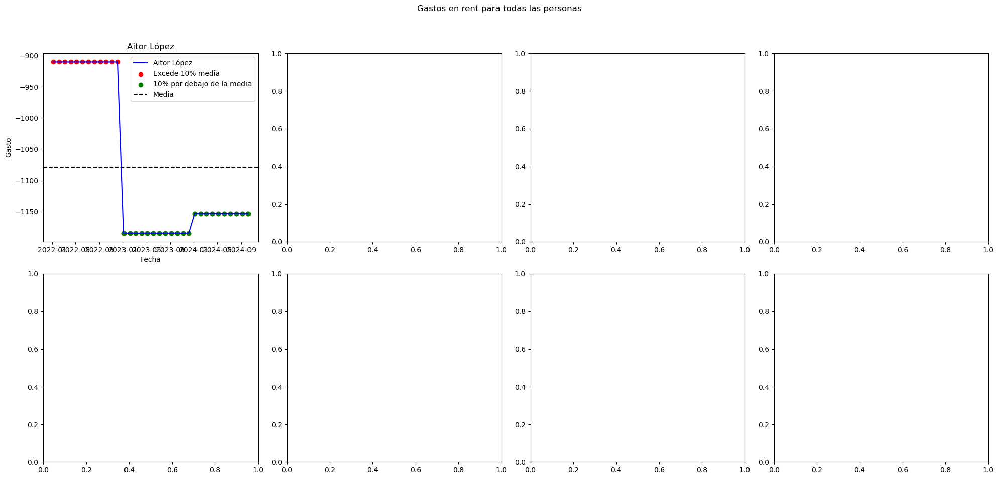

C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['exceeds_10_pct'] = cat_data['trx_amount'] > (1.1 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['below_10_pct'] = cat_data['trx_amount'] < (0.9 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slic

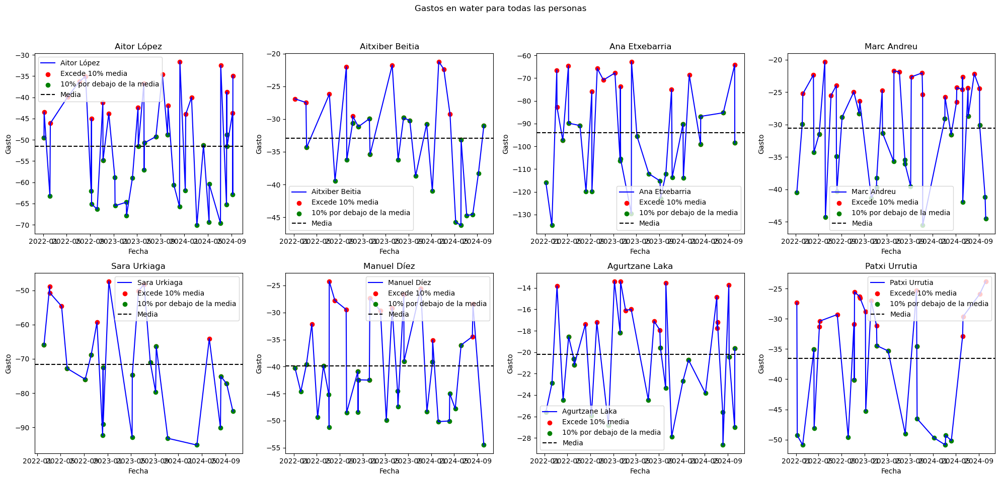

C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['exceeds_10_pct'] = cat_data['trx_amount'] > (1.1 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['below_10_pct'] = cat_data['trx_amount'] < (0.9 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slic

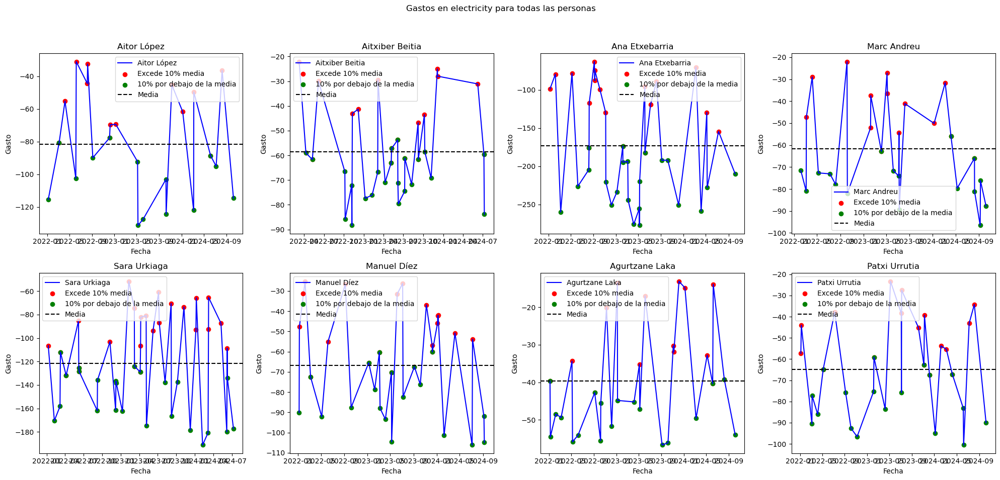

C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['exceeds_10_pct'] = cat_data['trx_amount'] > (1.1 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['below_10_pct'] = cat_data['trx_amount'] < (0.9 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slic

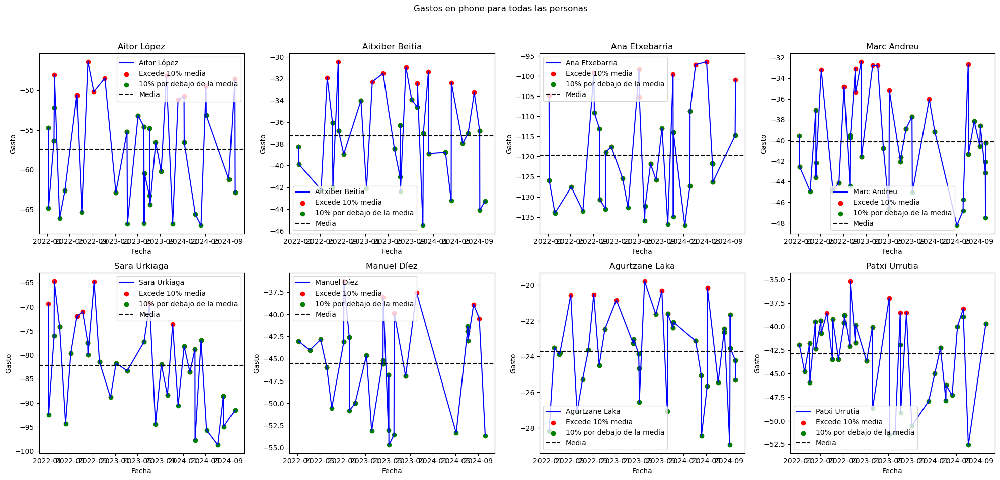

C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['exceeds_10_pct'] = cat_data['trx_amount'] > (1.1 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['below_10_pct'] = cat_data['trx_amount'] < (0.9 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slic

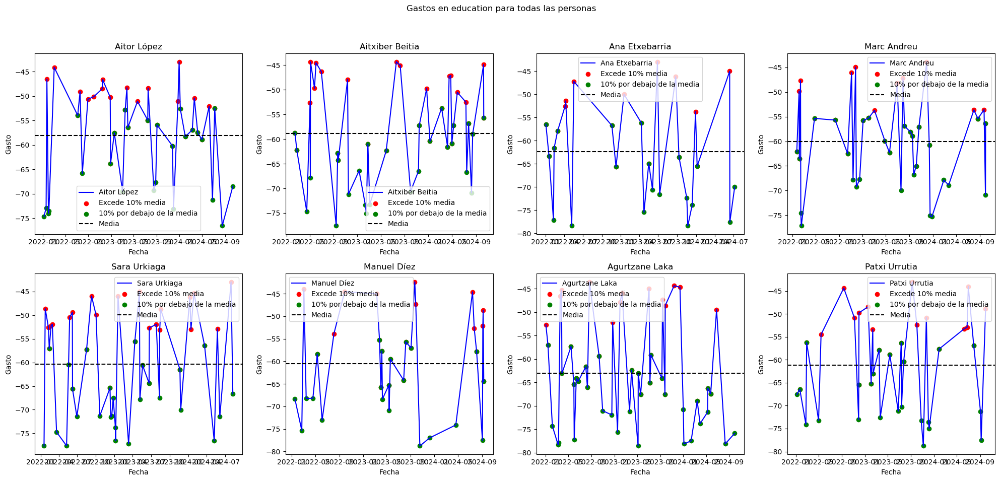

C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['exceeds_10_pct'] = cat_data['trx_amount'] > (1.1 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['below_10_pct'] = cat_data['trx_amount'] < (0.9 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slic

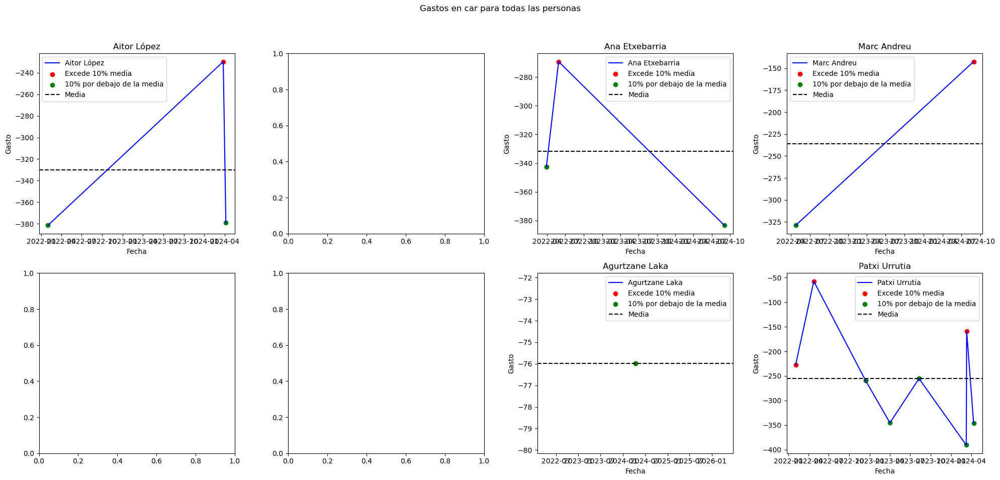

C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['exceeds_10_pct'] = cat_data['trx_amount'] > (1.1 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['below_10_pct'] = cat_data['trx_amount'] < (0.9 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slic

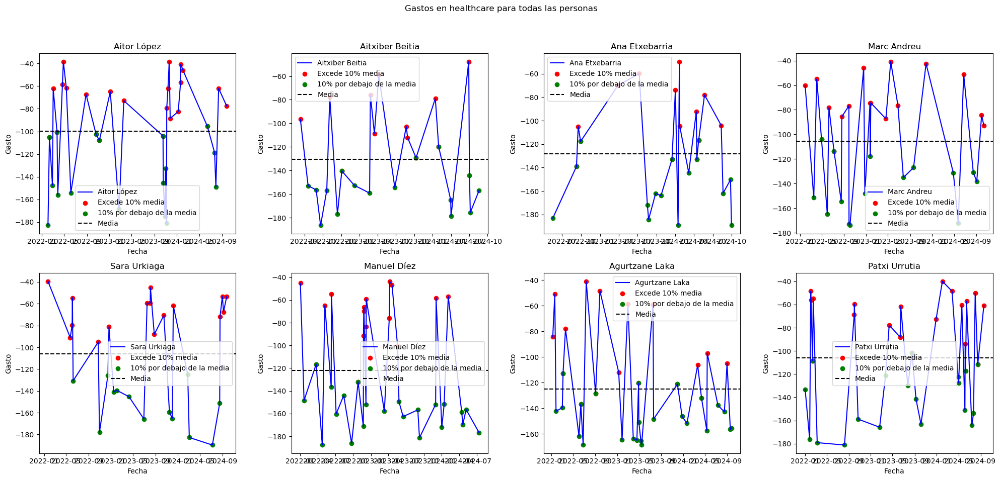

C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['exceeds_10_pct'] = cat_data['trx_amount'] > (1.1 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['below_10_pct'] = cat_data['trx_amount'] < (0.9 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slic

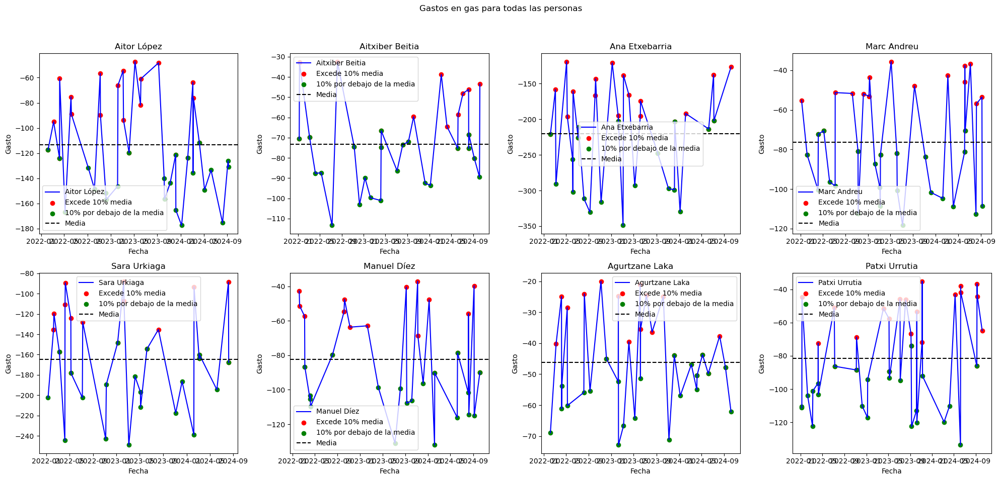

C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['exceeds_10_pct'] = cat_data['trx_amount'] > (1.1 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['below_10_pct'] = cat_data['trx_amount'] < (0.9 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slic

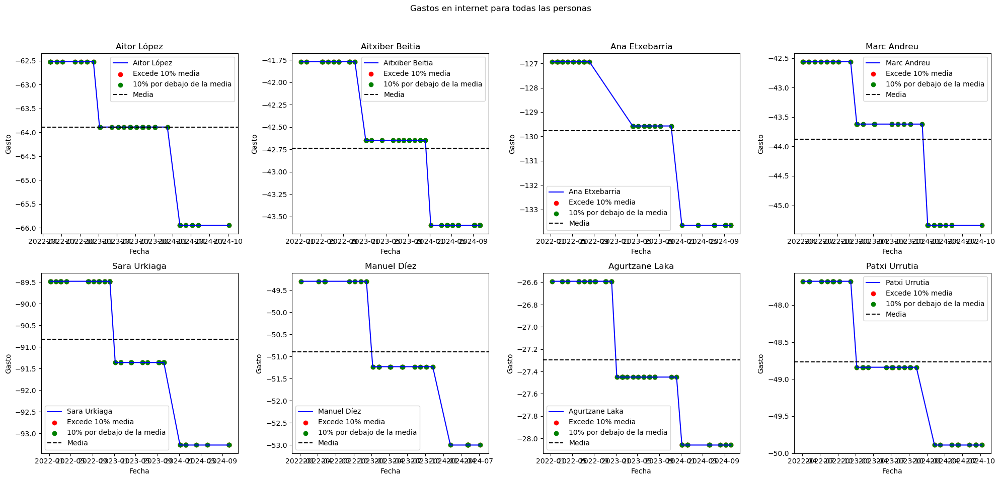

C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['exceeds_10_pct'] = cat_data['trx_amount'] > (1.1 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['below_10_pct'] = cat_data['trx_amount'] < (0.9 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slic

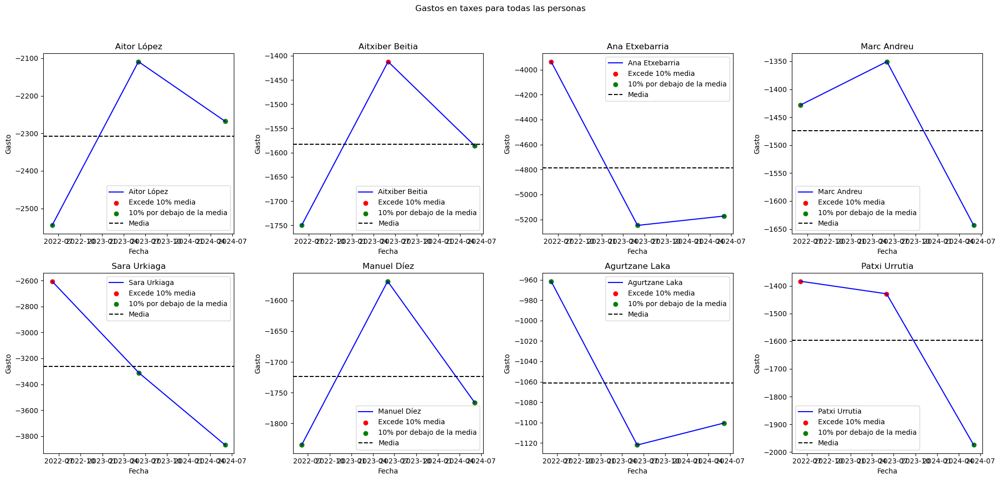

C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['exceeds_10_pct'] = cat_data['trx_amount'] > (1.1 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['below_10_pct'] = cat_data['trx_amount'] < (0.9 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slic

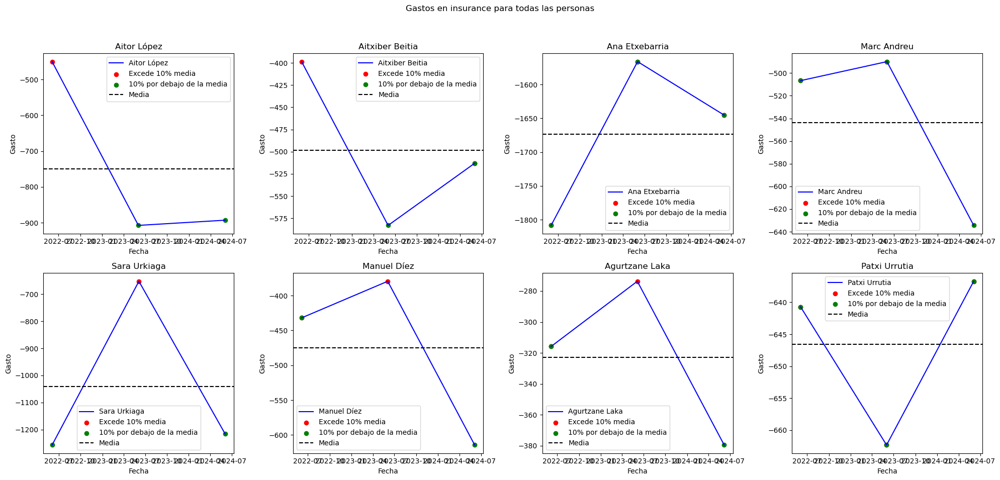

C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['exceeds_10_pct'] = cat_data['trx_amount'] > (1.1 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['below_10_pct'] = cat_data['trx_amount'] < (0.9 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slic

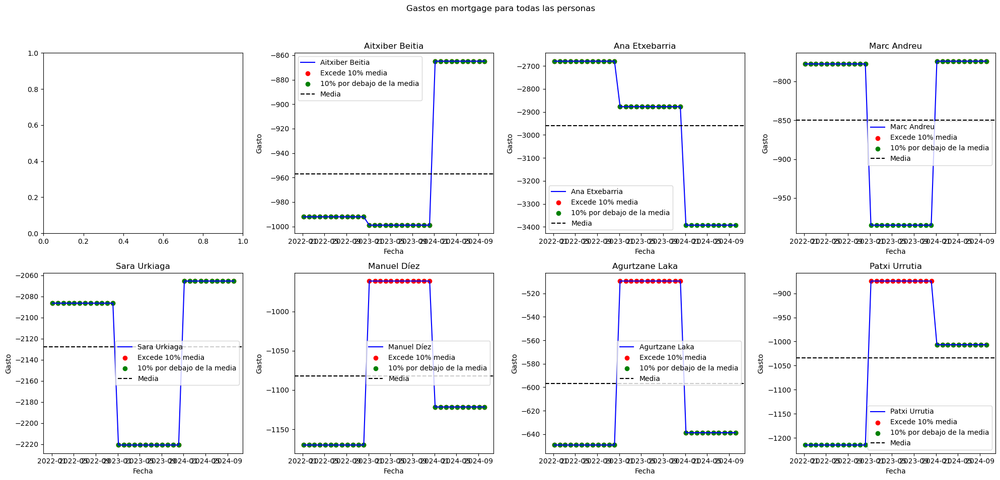

C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['exceeds_10_pct'] = cat_data['trx_amount'] > (1.1 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['below_10_pct'] = cat_data['trx_amount'] < (0.9 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\2816285394.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slic

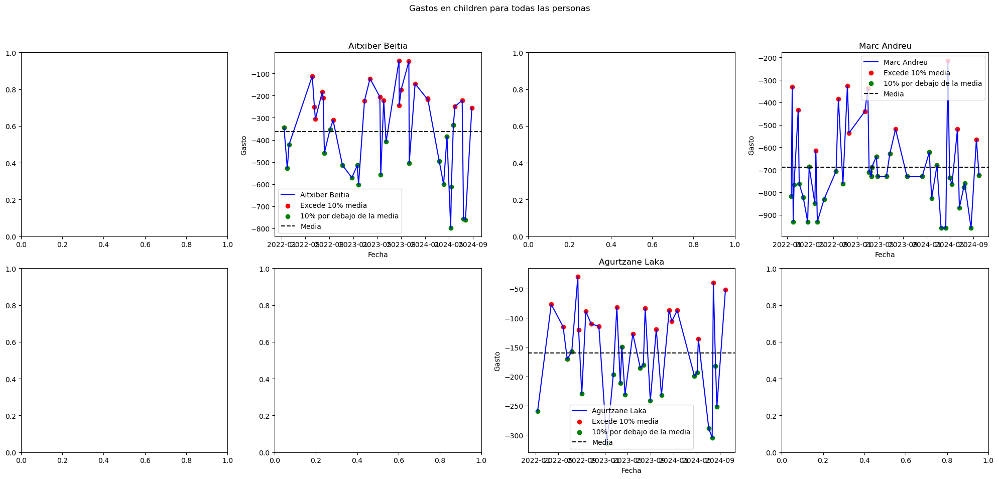

In [507]:
import pandas as pd
import matplotlib.pyplot as plt

data['trx_date'] = pd.to_datetime(data['trx_date'])

trx_categories = ['rent', 'water', 'electricity', 'phone', 'education', 'car', 'healthcare', 'gas', 'internet', 'taxes', 'insurance', 'mortgage', 'children']

persons = data[['name', 'surname']].drop_duplicates()

for category in trx_categories:
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))  # Crear una figura con subplots 2x4
    
    axes = axes.flatten()
    
    for i, (name, surname) in enumerate(persons.values):
        person_data = data[(data['name'] == name) & (data['surname'] == surname)]
        
        cat_data = person_data[person_data['trx_cat'] == category]
        
        if len(cat_data) == 0:
            continue  # Saltar si no hay datos para esta categoría
        
        mean_spending = cat_data['trx_amount'].mean()
        
        # Crear nuevas columnas que marquen si el gasto excede o está por debajo del 10% de la media
        cat_data['exceeds_10_pct'] = cat_data['trx_amount'] > (1.1 * mean_spending)
        cat_data['below_10_pct'] = cat_data['trx_amount'] < (0.9 * mean_spending)
        
        # Seleccionar el eje correspondiente
        ax = axes[i]
        
        # Graficar la serie de tiempo para esta persona
        ax.plot(cat_data['trx_date'], cat_data['trx_amount'], label=f'{name} {surname}', color='blue')
        
        # Cambiar el color cuando el gasto excede el 10% de la media
        ax.scatter(cat_data['trx_date'][cat_data['exceeds_10_pct']], 
                   cat_data['trx_amount'][cat_data['exceeds_10_pct']], 
                   color='red', label='Excede 10% media')
        ax.scatter(cat_data['trx_date'][cat_data['below_10_pct']], 
                   cat_data['trx_amount'][cat_data['below_10_pct']], 
                   color='green', label='10% por debajo de la media')
        ax.axhline(y=mean_spending, color='black', linestyle='--', label='Media')
        ax.set_title(f'{name} {surname}')
        ax.set_xlabel('Fecha')
        ax.set_ylabel('Gasto')
        ax.legend()
    
    plt.suptitle(f'Gastos en {category} para todas las personas')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

In [508]:
'''import pandas as pd
import matplotlib.pyplot as plt

# Asegurarse de que 'trx_date' esté en formato datetime
df['trx_date'] = pd.to_datetime(df['trx_date'])

# Lista de categorías de transacciones
trx_categories = ['rent', 'water', 'electricity', 'phone', 'education', 'car', 'healthcare', 'gas', 'internet', 'taxes', 'insurance', 'mortgage', 'children']

# Iterar sobre cada persona en el dataframe
for name in df['name'].unique():
    for surname in df['surname'].unique():
        # Filtrar los datos por persona
        person_df = df[(df['name'] == name) & (df['surname'] == surname)]
        
        # Verificar si hay datos para esta combinación de persona
        if len(person_df) == 0:
            continue
        
        # Iterar sobre cada categoría de transacción
        for category in trx_categories:
            # Filtrar datos por categoría de transacción
            cat_df = person_df[person_df['trx_cat'] == category]
            
            if len(cat_df) == 0:
                continue  # Saltar si no hay datos para esta categoría
            
            # Calcular la media de gasto para esta categoría
            mean_spending = cat_df['trx_amount'].mean()
            
            # Crear nuevas columnas que marquen si el gasto excede o está por debajo del 10% de la media
            cat_df['exceeds_10_pct'] = cat_df['trx_amount'] > (1.1 * mean_spending)
            cat_df['below_10_pct'] = cat_df['trx_amount'] < (0.9 * mean_spending)
            
            plt.figure(figsize=(12, 6))
            
            # Graficar la serie de tiempo
            plt.plot(cat_df['trx_date'], cat_df['trx_amount'], label=f'Gastos en {category}', color='blue')
            
            # Cambiar el color cuando el gasto excede el 10% de la media
            plt.scatter(cat_df['trx_date'][cat_df['exceeds_10_pct']], 
                        cat_df['trx_amount'][cat_df['exceeds_10_pct']], 
                        color='red', label='Excede 10% media')
            
            # Cambiar el color cuando el gasto está por debajo del 10% de la media
            plt.scatter(cat_df['trx_date'][cat_df['below_10_pct']], 
                        cat_df['trx_amount'][cat_df['below_10_pct']], 
                        color='green', label='10% por debajo de la media')
            
            # Añadir la línea de la media de gasto
            plt.axhline(y=mean_spending, color='green', linestyle='--', label=f'Media de {category}')
            
            # Títulos y leyenda
            plt.title(f'Gastos en {category} para {name} {surname} a lo largo del tiempo')
            plt.xlabel('Fecha')
            plt.ylabel('Gasto')
            plt.legend()
            
            # Mostrar la gráfica
            plt.show()
'''

"import pandas as pd\nimport matplotlib.pyplot as plt\n\n# Asegurarse de que 'trx_date' esté en formato datetime\ndf['trx_date'] = pd.to_datetime(df['trx_date'])\n\n# Lista de categorías de transacciones\ntrx_categories = ['rent', 'water', 'electricity', 'phone', 'education', 'car', 'healthcare', 'gas', 'internet', 'taxes', 'insurance', 'mortgage', 'children']\n\n# Iterar sobre cada persona en el dataframe\nfor name in df['name'].unique():\n    for surname in df['surname'].unique():\n        # Filtrar los datos por persona\n        person_df = df[(df['name'] == name) & (df['surname'] == surname)]\n        \n        # Verificar si hay datos para esta combinación de persona\n        if len(person_df) == 0:\n            continue\n        \n        # Iterar sobre cada categoría de transacción\n        for category in trx_categories:\n            # Filtrar datos por categoría de transacción\n            cat_df = person_df[person_df['trx_cat'] == category]\n            \n            if len(c

## Gastos aleatorios

C:\Users\User\AppData\Local\Temp\ipykernel_8012\3236318634.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['exceeds_10_pct'] = cat_data['trx_amount'] > (1.1 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\3236318634.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['below_10_pct'] = cat_data['trx_amount'] < (0.9 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\3236318634.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slic

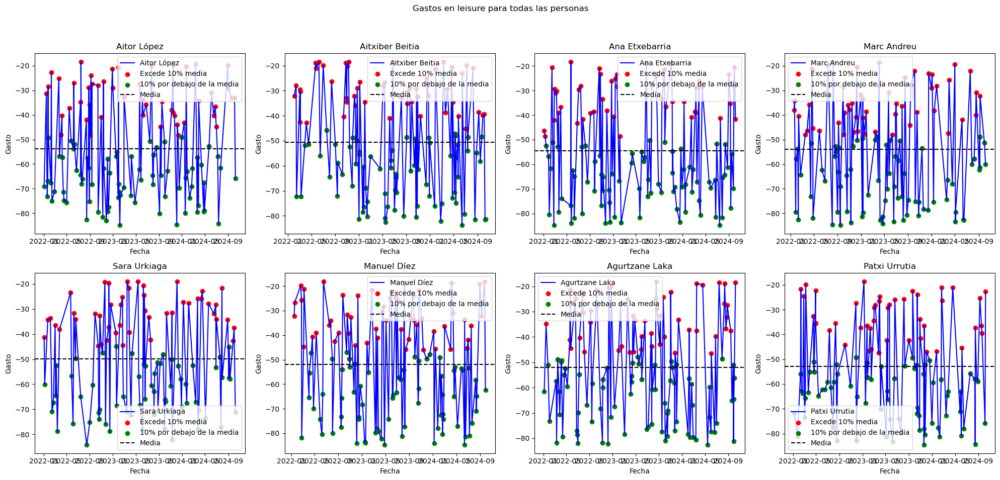

C:\Users\User\AppData\Local\Temp\ipykernel_8012\3236318634.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['exceeds_10_pct'] = cat_data['trx_amount'] > (1.1 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\3236318634.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['below_10_pct'] = cat_data['trx_amount'] < (0.9 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\3236318634.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slic

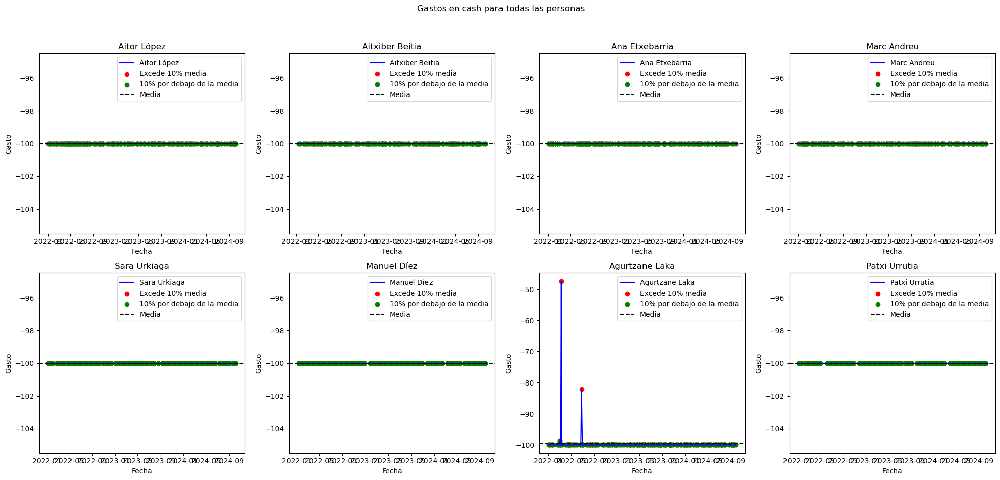

C:\Users\User\AppData\Local\Temp\ipykernel_8012\3236318634.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['exceeds_10_pct'] = cat_data['trx_amount'] > (1.1 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\3236318634.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['below_10_pct'] = cat_data['trx_amount'] < (0.9 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\3236318634.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slic

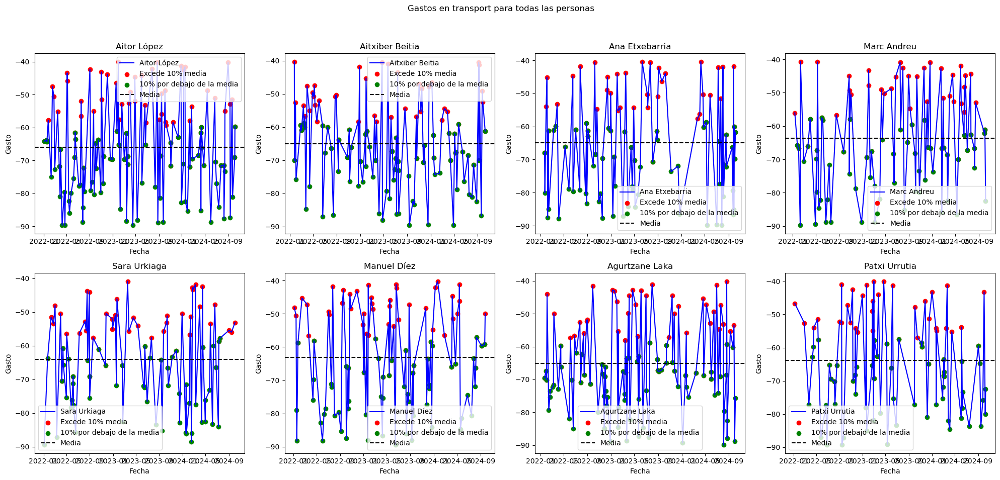

C:\Users\User\AppData\Local\Temp\ipykernel_8012\3236318634.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['exceeds_10_pct'] = cat_data['trx_amount'] > (1.1 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\3236318634.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['below_10_pct'] = cat_data['trx_amount'] < (0.9 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\3236318634.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slic

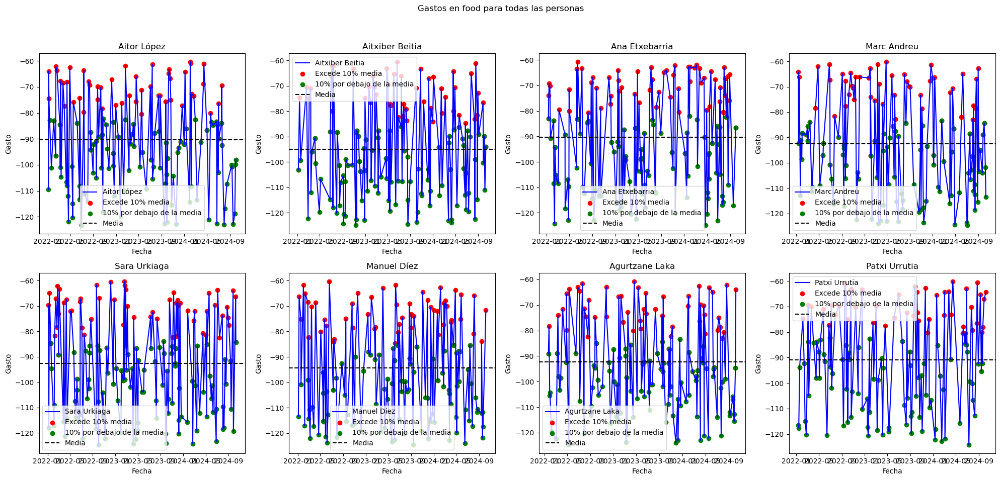

C:\Users\User\AppData\Local\Temp\ipykernel_8012\3236318634.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['exceeds_10_pct'] = cat_data['trx_amount'] > (1.1 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\3236318634.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['below_10_pct'] = cat_data['trx_amount'] < (0.9 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\3236318634.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slic

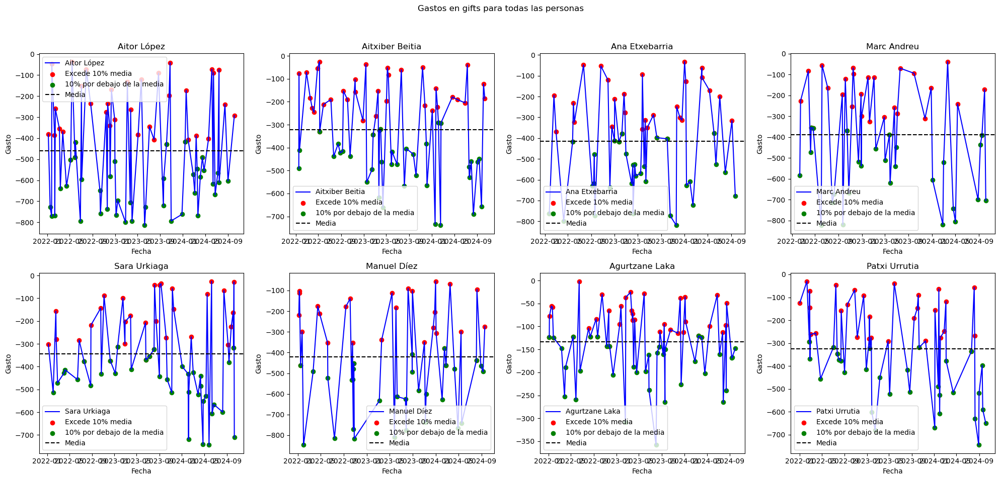

C:\Users\User\AppData\Local\Temp\ipykernel_8012\3236318634.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['exceeds_10_pct'] = cat_data['trx_amount'] > (1.1 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\3236318634.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['below_10_pct'] = cat_data['trx_amount'] < (0.9 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\3236318634.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slic

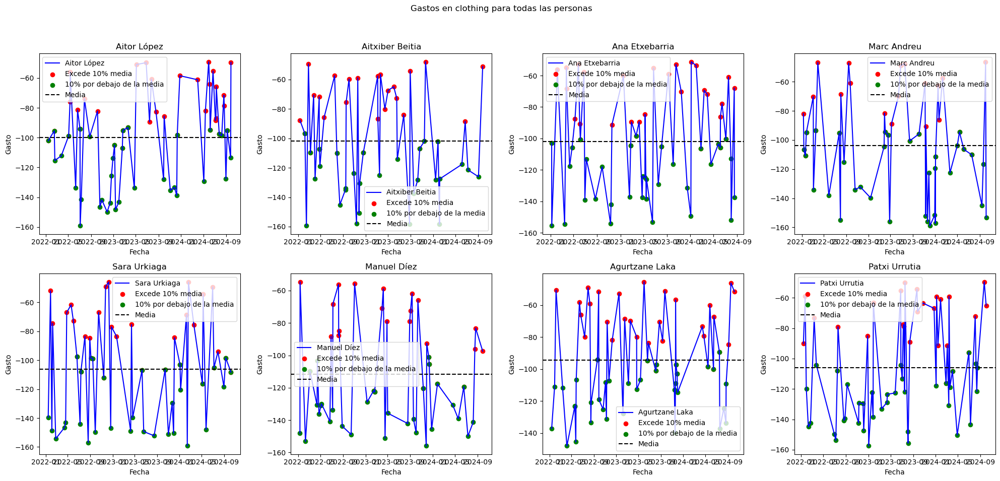

C:\Users\User\AppData\Local\Temp\ipykernel_8012\3236318634.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['exceeds_10_pct'] = cat_data['trx_amount'] > (1.1 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\3236318634.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['below_10_pct'] = cat_data['trx_amount'] < (0.9 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\3236318634.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slic

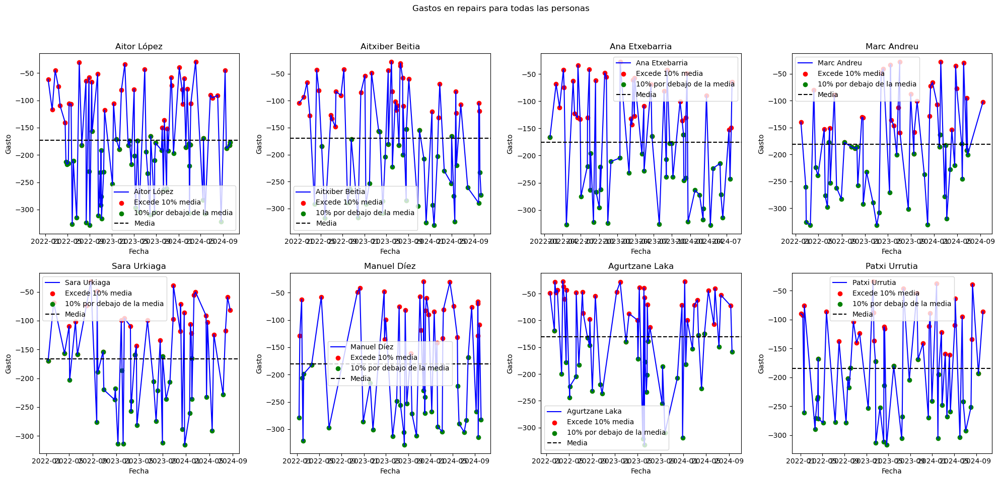

C:\Users\User\AppData\Local\Temp\ipykernel_8012\3236318634.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['exceeds_10_pct'] = cat_data['trx_amount'] > (1.1 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\3236318634.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['below_10_pct'] = cat_data['trx_amount'] < (0.9 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\3236318634.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slic

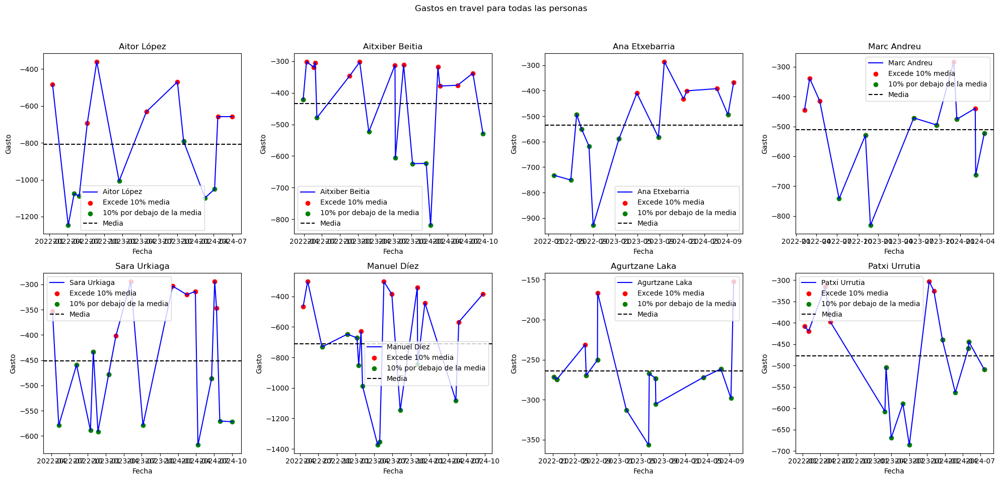

C:\Users\User\AppData\Local\Temp\ipykernel_8012\3236318634.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['exceeds_10_pct'] = cat_data['trx_amount'] > (1.1 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\3236318634.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_data['below_10_pct'] = cat_data['trx_amount'] < (0.9 * mean_spending)
C:\Users\User\AppData\Local\Temp\ipykernel_8012\3236318634.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slic

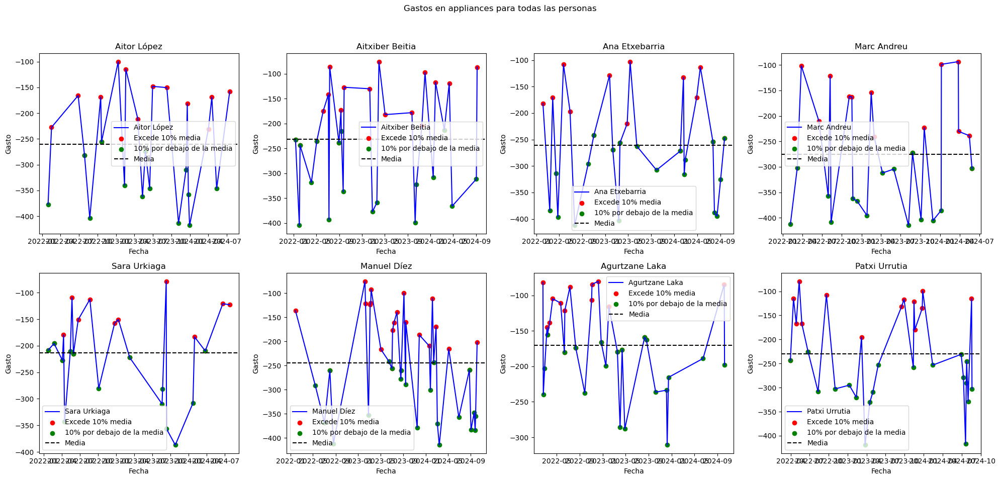

In [509]:
import pandas as pd
import matplotlib.pyplot as plt

data['trx_date'] = pd.to_datetime(data['trx_date'])

trx_categories = ['leisure', 'cash', 'transport', 'food', 'gifts', 'clothing', 'repairs', 'travel', 'appliances']

persons = data[['name', 'surname']].drop_duplicates()

for category in trx_categories:
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    
    axes = axes.flatten()
    
    for i, (name, surname) in enumerate(persons.values):
        person_data = data[(data['name'] == name) & (data['surname'] == surname)]
        
        cat_data = person_data[person_data['trx_cat'] == category]
        
        if len(cat_data) == 0:
            continue  # Saltar si no hay datos para esta categoría
        
        mean_spending = cat_data['trx_amount'].mean()
        
        # Crear nuevas columnas que marquen si el gasto excede o está por debajo del 10% de la media
        cat_data['exceeds_10_pct'] = cat_data['trx_amount'] > (1.1 * mean_spending)
        cat_data['below_10_pct'] = cat_data['trx_amount'] < (0.9 * mean_spending)
        
        # Seleccionar el eje correspondiente
        ax = axes[i]
        
        # Graficar la serie de tiempo para esta persona
        ax.plot(cat_data['trx_date'], cat_data['trx_amount'], label=f'{name} {surname}', color='blue')
        
        # Cambiar el color cuando el gasto excede el 10% de la media
        ax.scatter(cat_data['trx_date'][cat_data['exceeds_10_pct']], 
                   cat_data['trx_amount'][cat_data['exceeds_10_pct']], 
                   color='red', label='Excede 10% media')
        ax.scatter(cat_data['trx_date'][cat_data['below_10_pct']], 
                   cat_data['trx_amount'][cat_data['below_10_pct']], 
                   color='green', label='10% por debajo de la media')
        ax.axhline(y=mean_spending, color='black', linestyle='--', label='Media')
        ax.set_title(f'{name} {surname}')
        ax.set_xlabel('Fecha')
        ax.set_ylabel('Gasto')
        ax.legend()
    
    plt.suptitle(f'Gastos en {category} para todas las personas')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

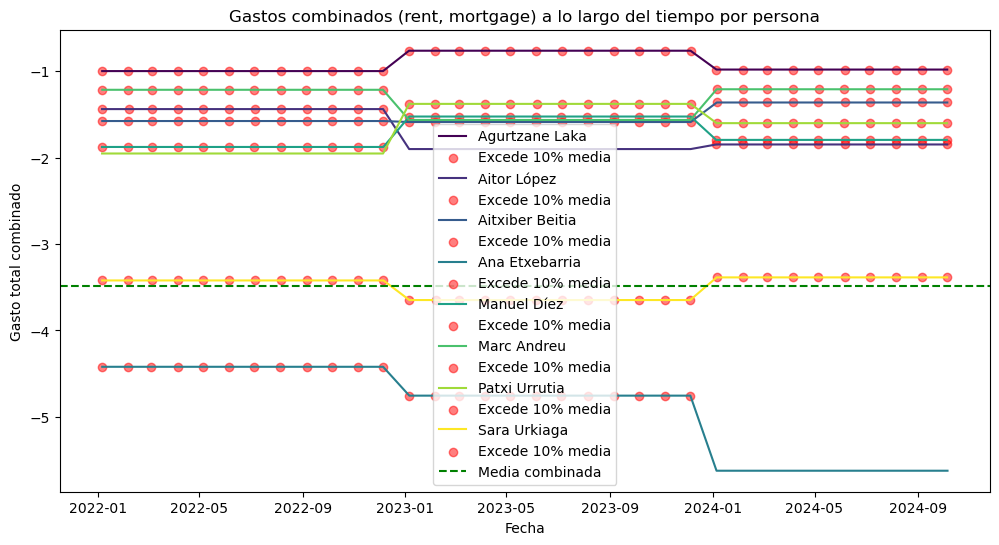

In [510]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

df['trx_date'] = pd.to_datetime(df['trx_date'])

categories_to_sum = ['rent', 'mortgage']

plt.figure(figsize=(12, 6))

colors = plt.cm.viridis(np.linspace(0, 1, len(df['name'].unique())))

for idx, (name, surname) in enumerate(df.groupby(['name', 'surname']).groups.keys()):
    person_df = df[(df['name'] == name) & (df['surname'] == surname)]
    
    if len(person_df) == 0:
        continue
    
    # Graficar la suma de las categorías seleccionadas
    combined_df = person_df[person_df['trx_cat'].isin(categories_to_sum)]
    
    # Sumar los gastos por 'trx_date'
    combined_spending = combined_df.groupby('trx_date')['trx_amount'].sum()
    
    # Calcular la media del gasto combinado
    combined_mean_spending = combined_spending.mean() if not combined_spending.empty else 0
    
    # Identificar si el gasto combinado excede el 10% de la media
    exceeds_10_pct_combined = combined_spending > (1.1 * combined_mean_spending)

    # Graficar la serie de tiempo de gastos combinados
    plt.plot(combined_spending.index, combined_spending.values, label=f'{name} {surname}', color=colors[idx])

    # Cambiar el color cuando el gasto combinado excede el 10% de la media
    plt.scatter(combined_spending.index[exceeds_10_pct_combined], 
                combined_spending.values[exceeds_10_pct_combined], 
                color='red', label='Excede 10% media', alpha=0.5)

if not combined_spending.empty:
    plt.axhline(y=combined_mean_spending, color='green', linestyle='--', label='Media combinada')

plt.title('Gastos combinados (rent, mortgage) a lo largo del tiempo por persona')
plt.xlabel('Fecha')
plt.ylabel('Gasto total combinado')
plt.legend()
plt.show()


# Aviso de altos ingresos y gastos para cada uno y predicciones

Datos de Aitor López:
         incomes   expenses
count  34.000000  34.000000
mean    6.077040  -5.989069
std     1.447673   1.933944
min     5.112030 -10.270583
25%     5.221899  -7.000845
50%     5.386577  -5.457508
75%     6.239032  -4.811595
max     9.871036  -2.958710
Número de datos para Aitor López: 34
     trx_date  income_forecast  expense_forecast  savings_forecast
34 2024-11-30         6.193114         -5.512592         11.705706
35 2024-12-31         6.094662         -5.869709         11.964370
36 2025-01-31         6.106680         -5.924383         12.031063
37 2025-02-28         6.105213         -5.932754         12.037966
38 2025-03-31         6.105392         -5.934035         12.039427
39 2025-04-30         6.105370         -5.934231         12.039601
40 2025-05-31         6.105373         -5.934261         12.039634
41 2025-06-30         6.105372         -5.934266         12.039638
42 2025-07-31         6.105372         -5.934267         12.039639
43 2025-08-31      

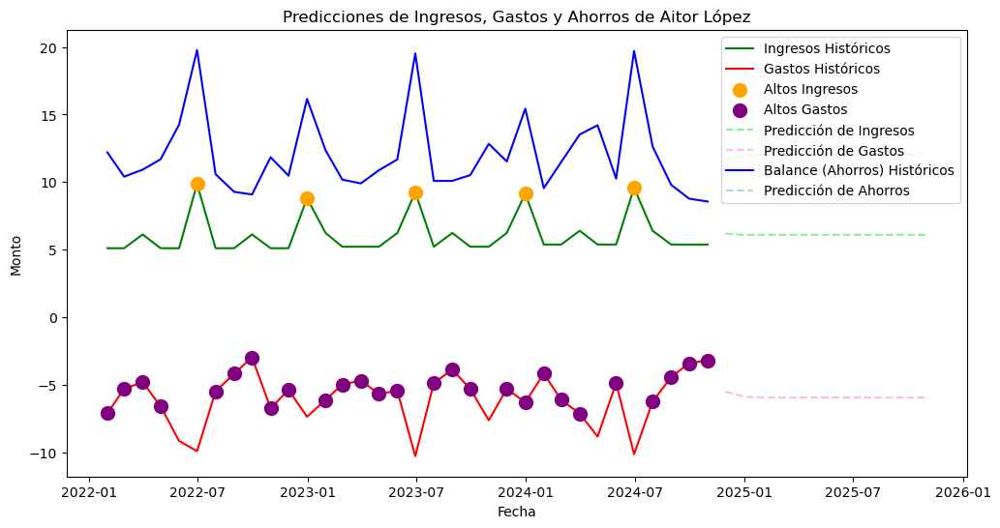

Datos de Aitxiber Beitia:
         incomes   expenses
count  34.000000  34.000000
mean    4.110413  -5.177838
std     1.025865   1.488099
min     3.446192  -8.639293
25%     3.516741  -6.131666
50%     3.593072  -5.292348
75%     4.232884  -4.074750
max     6.957146  -2.719659
Número de datos para Aitxiber Beitia: 34
     trx_date  income_forecast  expense_forecast  savings_forecast
34 2024-11-30         4.259790         -5.625643          9.885434
35 2024-12-31         4.098113         -5.098161          9.196275
36 2025-01-31         4.137319         -5.196438          9.333758
37 2025-02-28         4.127812         -5.178128          9.305940
38 2025-03-31         4.130118         -5.181539          9.311657
39 2025-04-30         4.129558         -5.180904          9.310462
40 2025-05-31         4.129694         -5.181022          9.310716
41 2025-06-30         4.129661         -5.181000          9.310661
42 2025-07-31         4.129669         -5.181004          9.310673
43 2025-08-

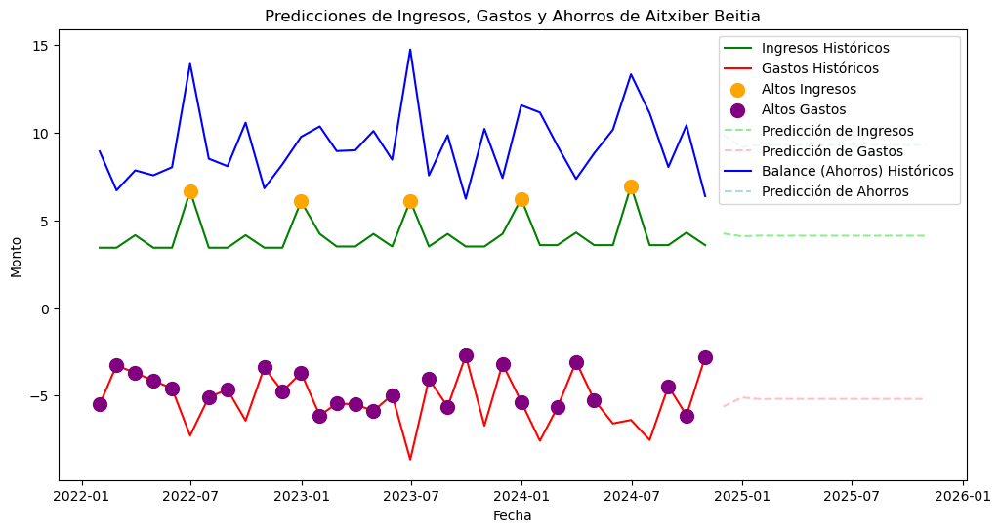

Datos de Ana Etxebarria:
         incomes   expenses
count  34.000000  34.000000
mean   12.041471  -9.664829
std     2.899286   3.566851
min    10.375339 -21.350410
25%    10.586600 -10.040690
50%    10.914439  -8.407091
75%    11.522768  -7.805931
max    19.428403  -6.947220
Número de datos para Ana Etxebarria: 34
     trx_date  income_forecast  expense_forecast  savings_forecast
34 2024-11-30        12.128878         -9.861258         21.990136
35 2024-12-31        12.076625         -9.693577         21.770203
36 2025-01-31        12.086437         -9.704095         21.790532
37 2025-02-28        12.084595         -9.703435         21.788030
38 2025-03-31        12.084941         -9.703477         21.788417
39 2025-04-30        12.084876         -9.703474         21.788350
40 2025-05-31        12.084888         -9.703474         21.788362
41 2025-06-30        12.084886         -9.703474         21.788360
42 2025-07-31        12.084886         -9.703474         21.788360
43 2025-08-31

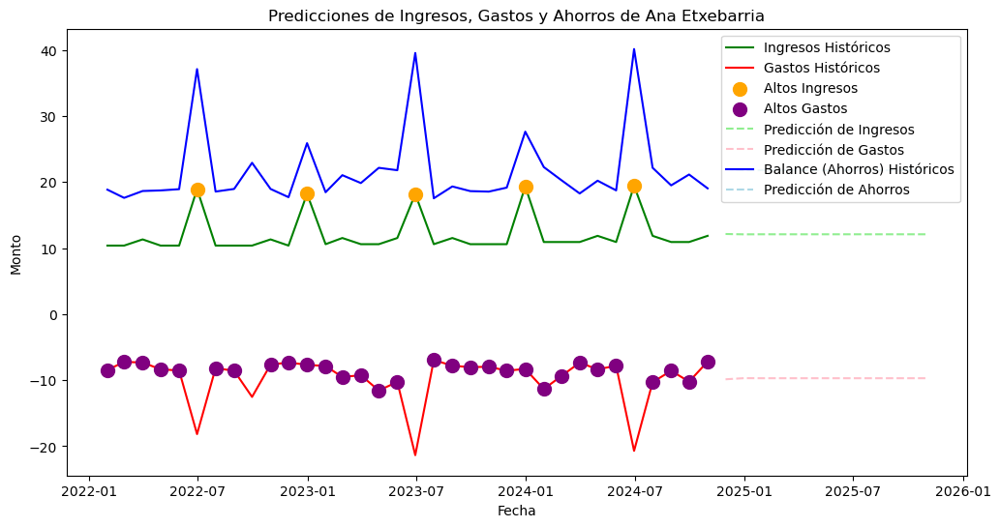

Datos de Marc Andreu:
         incomes   expenses
count  34.000000  34.000000
mean    4.159488  -5.702783
std     0.973250   1.805617
min     3.509461 -10.542327
25%     3.594690  -6.804967
50%     3.732520  -5.088029
75%     4.137862  -4.479830
max     6.621184  -3.146554
Número de datos para Marc Andreu: 34
     trx_date  income_forecast  expense_forecast  savings_forecast
34 2024-11-30         4.262588         -5.740798         10.003386
35 2024-12-31         4.162085         -5.749087          9.911172
36 2025-01-31         4.181140         -5.749129          9.930270
37 2025-02-28         4.177527         -5.749130          9.926657
38 2025-03-31         4.178212         -5.749130          9.927342
39 2025-04-30         4.178082         -5.749130          9.927212
40 2025-05-31         4.178107         -5.749130          9.927237
41 2025-06-30         4.178102         -5.749130          9.927232
42 2025-07-31         4.178103         -5.749130          9.927233
43 2025-08-31      

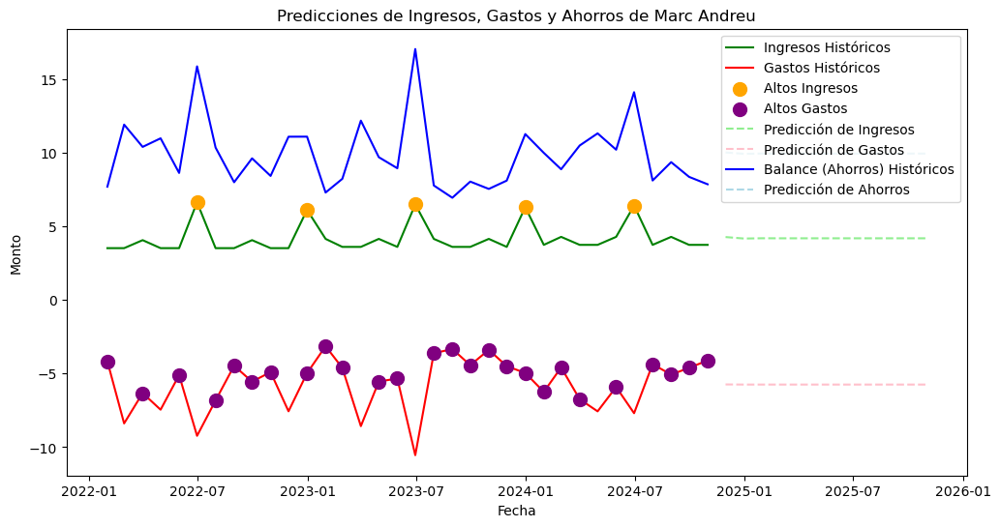

Datos de Sara Urkiaga:
         incomes   expenses
count  34.000000  34.000000
mean    8.578885  -7.215945
std     2.067268   2.279119
min     7.369091 -15.821058
25%     7.520404  -7.324015
50%     7.673166  -6.710743
75%     8.375168  -6.099258
max    14.280176  -4.522581
Número de datos para Sara Urkiaga: 34
     trx_date  income_forecast  expense_forecast  savings_forecast
34 2024-11-30         8.778743         -7.397311         16.176053
35 2024-12-31         8.585386         -7.237811         15.823197
36 2025-01-31         8.619202         -7.265193         15.884396
37 2025-02-28         8.613288         -7.260492         15.873780
38 2025-03-31         8.614322         -7.261300         15.875622
39 2025-04-30         8.614141         -7.261161         15.875302
40 2025-05-31         8.614173         -7.261185         15.875358
41 2025-06-30         8.614168         -7.261181         15.875348
42 2025-07-31         8.614169         -7.261181         15.875350
43 2025-08-31    

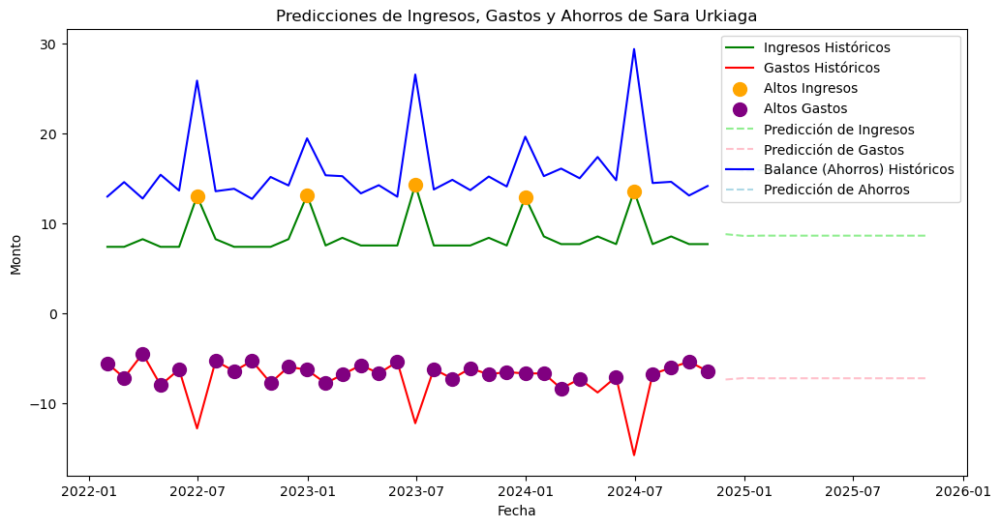

Datos de Manuel Díez:
         incomes   expenses
count  34.000000  34.000000
mean    4.853100  -5.380342
std     1.176327   1.853047
min     4.050280  -9.087562
25%     4.205469  -7.101364
50%     4.347849  -4.902063
75%     4.918476  -3.911601
max     7.798962  -2.502634
Número de datos para Manuel Díez: 34
     trx_date  income_forecast  expense_forecast  savings_forecast
34 2024-11-30         4.988306         -6.080548         11.068853
35 2024-12-31         4.851883         -5.187304         10.039188
36 2025-01-31         4.880942         -5.410307         10.291249
37 2025-02-28         4.874752         -5.354633         10.229386
38 2025-03-31         4.876071         -5.368532         10.244603
39 2025-04-30         4.875790         -5.365062         10.240853
40 2025-05-31         4.875850         -5.365929         10.241779
41 2025-06-30         4.875837         -5.365712         10.241550
42 2025-07-31         4.875840         -5.365766         10.241606
43 2025-08-31      

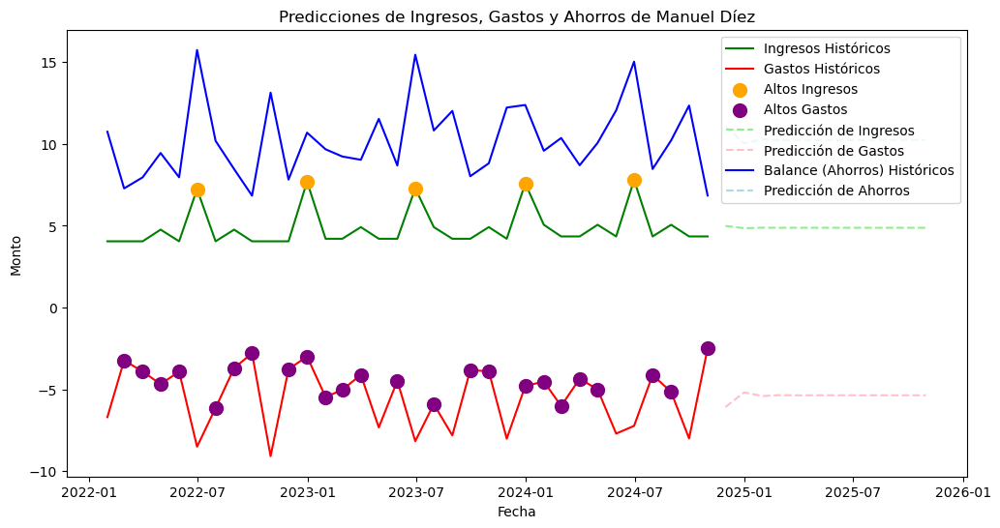

Datos de Agurtzane Laka:
         incomes   expenses
count  34.000000  34.000000
mean    2.686571  -2.858198
std     0.676221   1.014545
min     2.228292  -6.207127
25%     2.297139  -3.332802
50%     2.346301  -2.676196
75%     2.798885  -2.135781
max     4.535722  -1.060363
Número de datos para Agurtzane Laka: 34
     trx_date  income_forecast  expense_forecast  savings_forecast
34 2024-11-30         2.671277         -3.010650          5.681927
35 2024-12-31         2.702276         -2.836458          5.538733
36 2025-01-31         2.696840         -2.852016          5.548855
37 2025-02-28         2.697793         -2.850626          5.548419
38 2025-03-31         2.697626         -2.850750          5.548376
39 2025-04-30         2.697655         -2.850739          5.548394
40 2025-05-31         2.697650         -2.850740          5.548390
41 2025-06-30         2.697651         -2.850740          5.548391
42 2025-07-31         2.697651         -2.850740          5.548391
43 2025-08-31

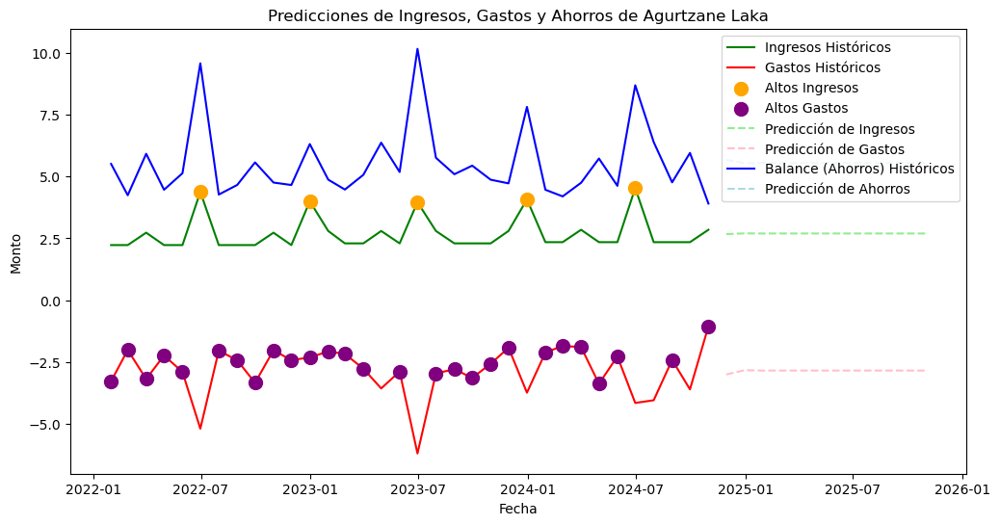

Datos de Patxi Urrutia:
         incomes   expenses
count  34.000000  34.000000
mean    4.202701  -4.720666
std     0.945647   1.235138
min     3.572797  -8.081171
25%     3.657133  -5.383819
50%     3.734036  -4.587820
75%     4.171671  -3.856780
max     6.526203  -2.557830
Número de datos para Patxi Urrutia: 34
     trx_date  income_forecast  expense_forecast  savings_forecast
34 2024-11-30         4.216892         -4.456779          8.673671
35 2024-12-31         4.220171         -4.671564          8.891735
36 2025-01-31         4.219832         -4.700159          8.919990
37 2025-02-28         4.219867         -4.703966          8.923832
38 2025-03-31         4.219863         -4.704472          8.924335
39 2025-04-30         4.219863         -4.704540          8.924403
40 2025-05-31         4.219863         -4.704549          8.924412
41 2025-06-30         4.219863         -4.704550          8.924413
42 2025-07-31         4.219863         -4.704550          8.924414
43 2025-08-31  

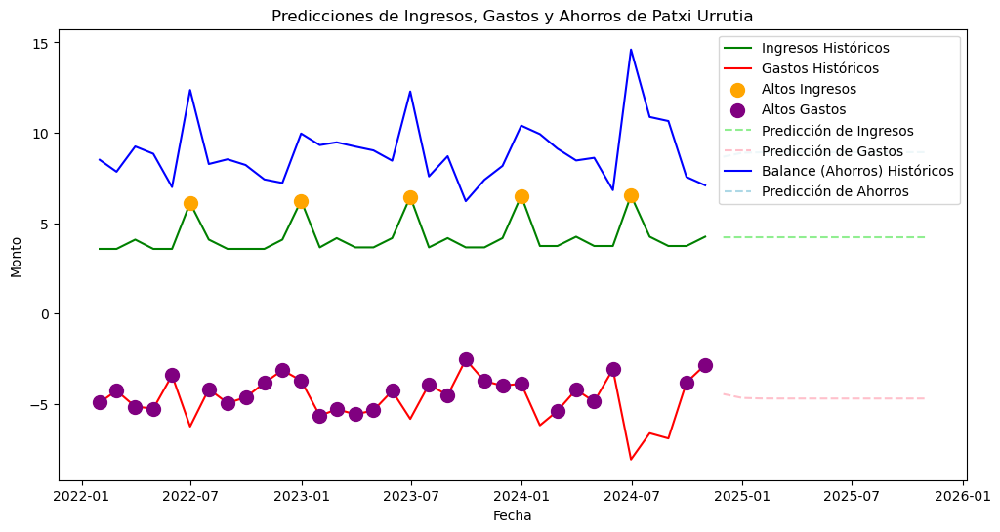

In [511]:
import pandas as pd
import numpy as np
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt

unique_persons = df[['name', 'surname']].drop_duplicates()
for index, person in unique_persons.iterrows():
    name, surname = person['name'], person['surname']
    
    person_df = df[(df['name'] == name) & (df['surname'] == surname)].copy()
    
    person_df['trx_date'] = pd.to_datetime(person_df['trx_date'])
    
    # Crear columnas separadas para ingresos y gastos (usando 'trx_type' y 'trx_amount')
    person_df['incomes'] = person_df.apply(lambda x: x['trx_amount'] if x['trx_type'] == 'incomes' else 0, axis=1)
    person_df['expenses'] = person_df.apply(lambda x: x['trx_amount'] if x['trx_type'] == 'expenses' else 0, axis=1)
    
    # Convertir a periodo mensual usando 'trx_date' como índice
    person_df.set_index('trx_date', inplace=True)
    
    # Sumar ingresos y gastos mensuales
    monthly_person_df = person_df.resample('M').sum()
    monthly_person_df.fillna(0, inplace=True)
    
    # Crear un nuevo dfFrame solo con ingresos, gastos y balance
    monthly_person_df['balance'] = monthly_person_df['incomes'] - monthly_person_df['expenses']
    monthly_person_df.reset_index(inplace=True)
    
    # Verificar si hay suficientes datos y que no haya NaN
    print(f"Datos de {name} {surname}:")
    print(monthly_person_df[['incomes', 'expenses']].describe())
    monthly_person_df.dropna(subset=['incomes', 'expenses'], inplace=True)
    
    # Verificar la longitud de los datos
    print(f"Número de datos para {name} {surname}: {len(monthly_person_df['incomes'])}")
    
    if len(monthly_person_df['incomes']) > 0:
        # Ajustar un modelo ARIMA para ingresos
        model_income = ARIMA(monthly_person_df['incomes'], order=(1, 0, 0), enforce_stationarity=False, enforce_invertibility=False)
        model_income_fit = model_income.fit()

        # Hacer predicciones para los siguientes 12 meses
        income_forecast = model_income_fit.forecast(steps=12)

        # Ajustar un modelo ARIMA para gastos
        model_expense = ARIMA(monthly_person_df['expenses'], order=(1, 0, 0), enforce_stationarity=False, enforce_invertibility=False)
        model_expense_fit = model_expense.fit()

        # Hacer predicciones para los siguientes 12 meses
        expense_forecast = model_expense_fit.forecast(steps=12)

        # Crear un dfFrame para las predicciones
        forecast_index = pd.date_range(start=monthly_person_df['trx_date'].iloc[-1] + pd.DateOffset(months=1), periods=12, freq='M')
        forecast_df = pd.DataFrame({'trx_date': forecast_index, 'income_forecast': income_forecast, 'expense_forecast': expense_forecast})

        # Calcular ahorros (balance)
        forecast_df['savings_forecast'] = forecast_df['income_forecast'] - forecast_df['expense_forecast']

        # Mostrar las predicciones
        print(forecast_df)

        # Graficar las predicciones
        plt.figure(figsize=(12, 6))

        # Gráfica de ingresos y gastos históricos
        plt.plot(monthly_person_df['trx_date'], monthly_person_df['incomes'], label='Ingresos Históricos', color='green')
        plt.plot(monthly_person_df['trx_date'], monthly_person_df['expenses'], label='Gastos Históricos', color='red')

        # Calcular la media y el 20% de la media
        income_mean = monthly_person_df['incomes'].mean()
        expense_mean = monthly_person_df['expenses'].mean()
        income_threshold = income_mean * 1.2
        expense_threshold = expense_mean * 1.2
        
        # Identificar puntos que superan el 20% de la media
        high_income_points = monthly_person_df[monthly_person_df['incomes'] > income_threshold]
        high_expense_points = monthly_person_df[monthly_person_df['expenses'] > expense_threshold]

        # Graficar puntos que superan el 20% de la media
        plt.scatter(high_income_points['trx_date'], high_income_points['incomes'], color='orange', label='Altos Ingresos', s=100, zorder=5)
        plt.scatter(high_expense_points['trx_date'], high_expense_points['expenses'], color='purple', label='Altos Gastos', s=100, zorder=5)

        # Gráfica de predicción de ingresos y gastos
        plt.plot(forecast_df['trx_date'], forecast_df['income_forecast'], label='Predicción de Ingresos', color='lightgreen', linestyle='--')
        plt.plot(forecast_df['trx_date'], forecast_df['expense_forecast'], label='Predicción de Gastos', color='pink', linestyle='--')

        # Gráfica de balance/ahorros históricos y predicción
        plt.plot(monthly_person_df['trx_date'], monthly_person_df['balance'], label='Balance (Ahorros) Históricos', color='blue')
        plt.plot(forecast_df['trx_date'], forecast_df['savings_forecast'], label='Predicción de Ahorros', color='lightblue', linestyle='--')

        plt.title(f'Predicciones de Ingresos, Gastos y Ahorros de {name} {surname}')
        plt.xlabel('Fecha')
        plt.ylabel('Monto')
        plt.legend()
        plt.show()
    else:
        print(f"No hay suficientes datos para ajustar el modelo ARIMA para {name} {surname}.")


Datos de Aitor López:
         incomes   expenses
count  34.000000  34.000000
mean    6.077040  -5.989069
std     1.447673   1.933944
min     5.112030 -10.270583
25%     5.221899  -7.000845
50%     5.386577  -5.457508
75%     6.239032  -4.811595
max     9.871036  -2.958710
Número de datos para Aitor López: 34
     trx_date  income_forecast  expense_forecast  savings_forecast
34 2024-11-30         6.193114         -5.512592         11.705706
35 2024-12-31         6.094662         -5.869709         11.964370
36 2025-01-31         6.106680         -5.924383         12.031063
37 2025-02-28         6.105213         -5.932754         12.037966
38 2025-03-31         6.105392         -5.934035         12.039427
39 2025-04-30         6.105370         -5.934231         12.039601
40 2025-05-31         6.105373         -5.934261         12.039634
41 2025-06-30         6.105372         -5.934266         12.039638
42 2025-07-31         6.105372         -5.934267         12.039639
43 2025-08-31      

C:\Users\User\AppData\Local\Temp\ipykernel_8012\4223777751.py:74: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  category_colors = plt.cm.get_cmap('tab10', len(expense_categories))  # Obtener un mapa de colores


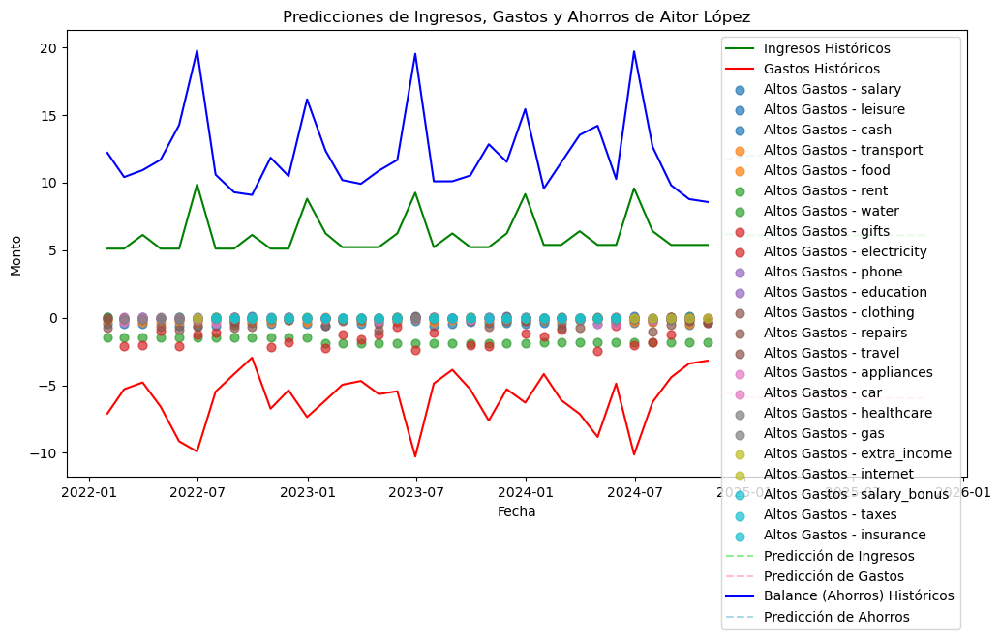

Datos de Aitxiber Beitia:
         incomes   expenses
count  34.000000  34.000000
mean    4.110413  -5.177838
std     1.025865   1.488099
min     3.446192  -8.639293
25%     3.516741  -6.131666
50%     3.593072  -5.292348
75%     4.232884  -4.074750
max     6.957146  -2.719659
Número de datos para Aitxiber Beitia: 34
     trx_date  income_forecast  expense_forecast  savings_forecast
34 2024-11-30         4.259790         -5.625643          9.885434
35 2024-12-31         4.098113         -5.098161          9.196275
36 2025-01-31         4.137319         -5.196438          9.333758
37 2025-02-28         4.127812         -5.178128          9.305940
38 2025-03-31         4.130118         -5.181539          9.311657
39 2025-04-30         4.129558         -5.180904          9.310462
40 2025-05-31         4.129694         -5.181022          9.310716
41 2025-06-30         4.129661         -5.181000          9.310661
42 2025-07-31         4.129669         -5.181004          9.310673
43 2025-08-

C:\Users\User\AppData\Local\Temp\ipykernel_8012\4223777751.py:74: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  category_colors = plt.cm.get_cmap('tab10', len(expense_categories))  # Obtener un mapa de colores


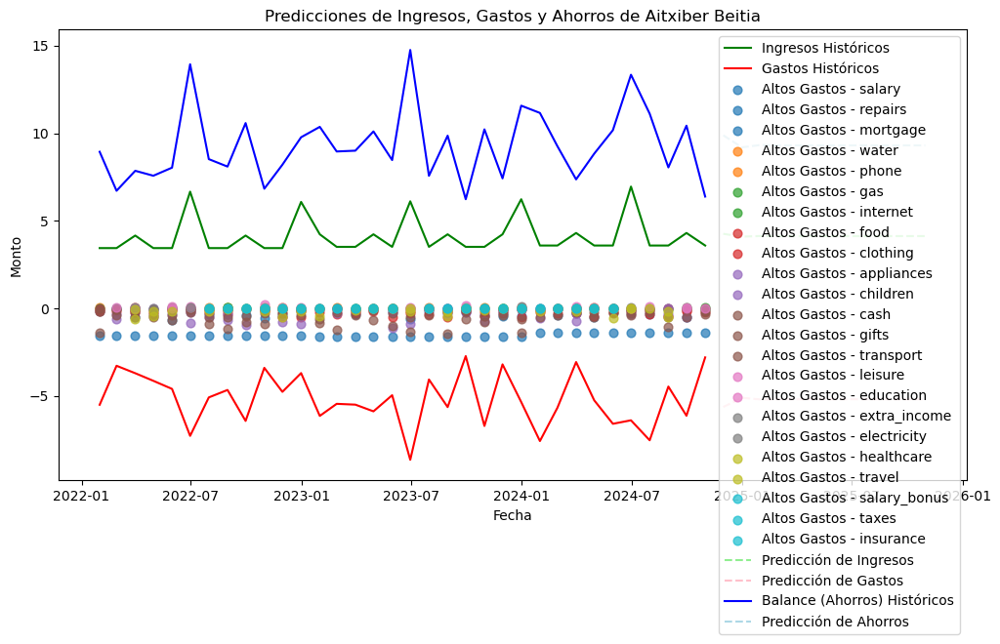

Datos de Ana Etxebarria:
         incomes   expenses
count  34.000000  34.000000
mean   12.041471  -9.664829
std     2.899286   3.566851
min    10.375339 -21.350410
25%    10.586600 -10.040690
50%    10.914439  -8.407091
75%    11.522768  -7.805931
max    19.428403  -6.947220
Número de datos para Ana Etxebarria: 34
     trx_date  income_forecast  expense_forecast  savings_forecast
34 2024-11-30        12.128878         -9.861258         21.990136
35 2024-12-31        12.076625         -9.693577         21.770203
36 2025-01-31        12.086437         -9.704095         21.790532
37 2025-02-28        12.084595         -9.703435         21.788030
38 2025-03-31        12.084941         -9.703477         21.788417
39 2025-04-30        12.084876         -9.703474         21.788350
40 2025-05-31        12.084888         -9.703474         21.788362
41 2025-06-30        12.084886         -9.703474         21.788360
42 2025-07-31        12.084886         -9.703474         21.788360
43 2025-08-31

C:\Users\User\AppData\Local\Temp\ipykernel_8012\4223777751.py:74: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  category_colors = plt.cm.get_cmap('tab10', len(expense_categories))  # Obtener un mapa de colores


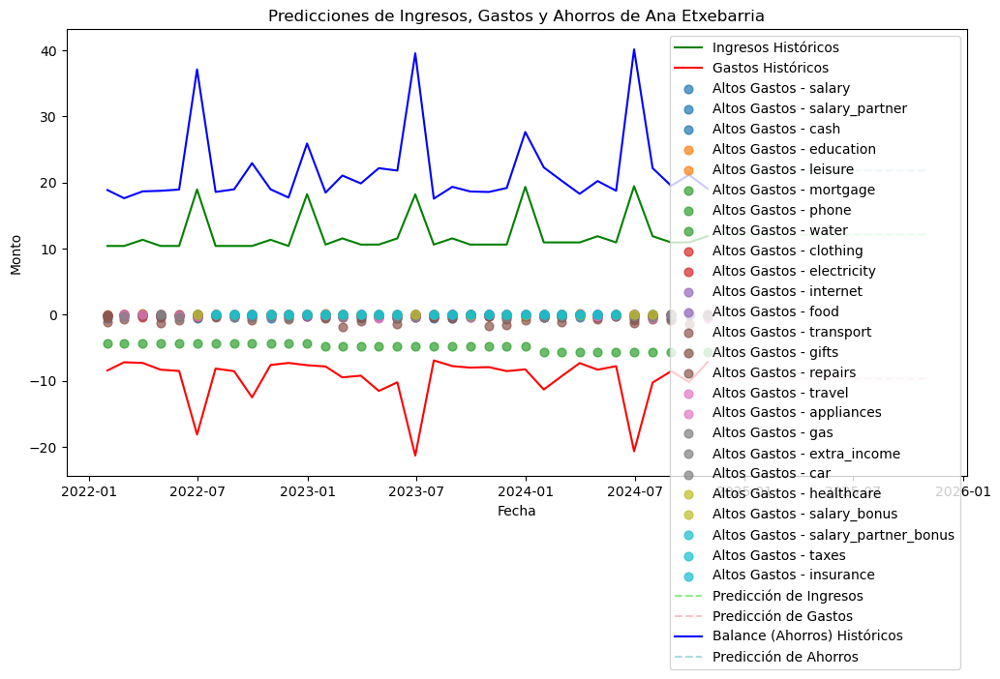

Datos de Marc Andreu:
         incomes   expenses
count  34.000000  34.000000
mean    4.159488  -5.702783
std     0.973250   1.805617
min     3.509461 -10.542327
25%     3.594690  -6.804967
50%     3.732520  -5.088029
75%     4.137862  -4.479830
max     6.621184  -3.146554
Número de datos para Marc Andreu: 34
     trx_date  income_forecast  expense_forecast  savings_forecast
34 2024-11-30         4.262588         -5.740798         10.003386
35 2024-12-31         4.162085         -5.749087          9.911172
36 2025-01-31         4.181140         -5.749129          9.930270
37 2025-02-28         4.177527         -5.749130          9.926657
38 2025-03-31         4.178212         -5.749130          9.927342
39 2025-04-30         4.178082         -5.749130          9.927212
40 2025-05-31         4.178107         -5.749130          9.927237
41 2025-06-30         4.178102         -5.749130          9.927232
42 2025-07-31         4.178103         -5.749130          9.927233
43 2025-08-31      

C:\Users\User\AppData\Local\Temp\ipykernel_8012\4223777751.py:74: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  category_colors = plt.cm.get_cmap('tab10', len(expense_categories))  # Obtener un mapa de colores


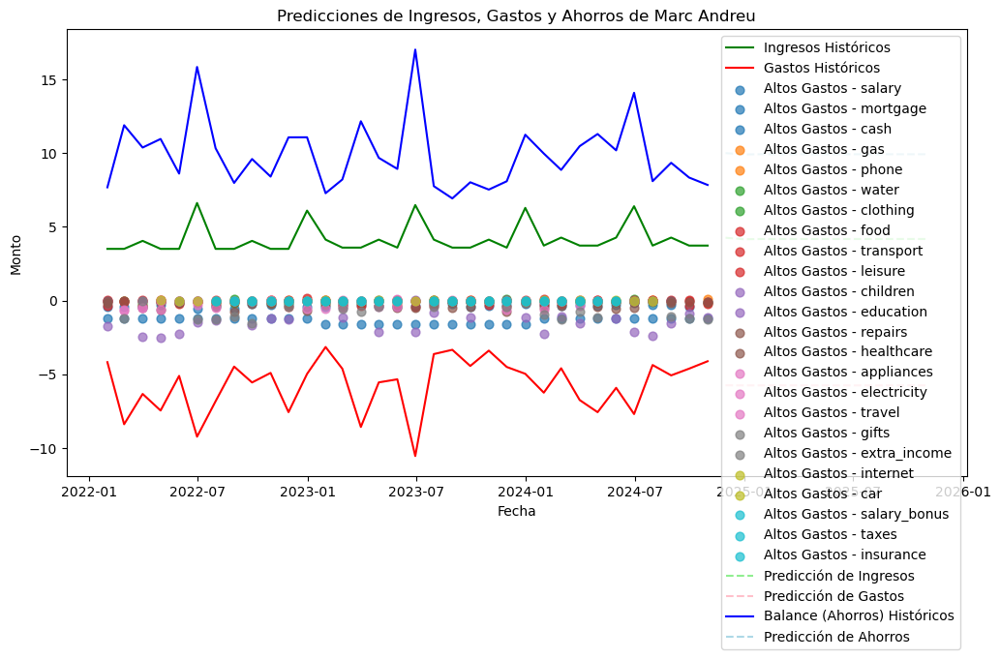

Datos de Sara Urkiaga:
         incomes   expenses
count  34.000000  34.000000
mean    8.578885  -7.215945
std     2.067268   2.279119
min     7.369091 -15.821058
25%     7.520404  -7.324015
50%     7.673166  -6.710743
75%     8.375168  -6.099258
max    14.280176  -4.522581
Número de datos para Sara Urkiaga: 34
     trx_date  income_forecast  expense_forecast  savings_forecast
34 2024-11-30         8.778743         -7.397311         16.176053
35 2024-12-31         8.585386         -7.237811         15.823197
36 2025-01-31         8.619202         -7.265193         15.884396
37 2025-02-28         8.613288         -7.260492         15.873780
38 2025-03-31         8.614322         -7.261300         15.875622
39 2025-04-30         8.614141         -7.261161         15.875302
40 2025-05-31         8.614173         -7.261185         15.875358
41 2025-06-30         8.614168         -7.261181         15.875348
42 2025-07-31         8.614169         -7.261181         15.875350
43 2025-08-31    

C:\Users\User\AppData\Local\Temp\ipykernel_8012\4223777751.py:74: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  category_colors = plt.cm.get_cmap('tab10', len(expense_categories))  # Obtener un mapa de colores


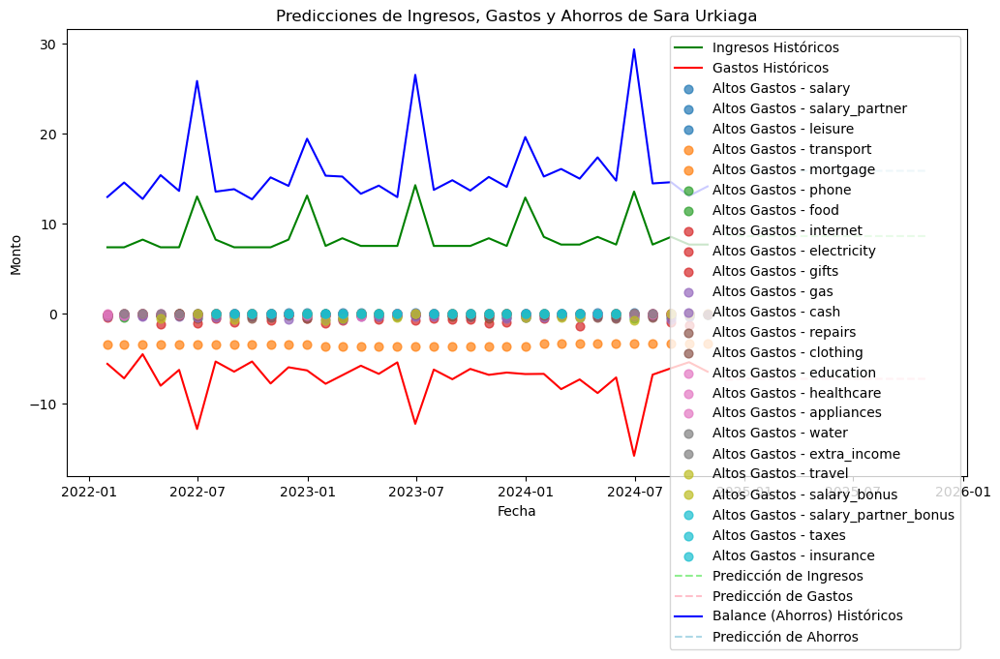

Datos de Manuel Díez:
         incomes   expenses
count  34.000000  34.000000
mean    4.853100  -5.380342
std     1.176327   1.853047
min     4.050280  -9.087562
25%     4.205469  -7.101364
50%     4.347849  -4.902063
75%     4.918476  -3.911601
max     7.798962  -2.502634
Número de datos para Manuel Díez: 34
     trx_date  income_forecast  expense_forecast  savings_forecast
34 2024-11-30         4.988306         -6.080548         11.068853
35 2024-12-31         4.851883         -5.187304         10.039188
36 2025-01-31         4.880942         -5.410307         10.291249
37 2025-02-28         4.874752         -5.354633         10.229386
38 2025-03-31         4.876071         -5.368532         10.244603
39 2025-04-30         4.875790         -5.365062         10.240853
40 2025-05-31         4.875850         -5.365929         10.241779
41 2025-06-30         4.875837         -5.365712         10.241550
42 2025-07-31         4.875840         -5.365766         10.241606
43 2025-08-31      

C:\Users\User\AppData\Local\Temp\ipykernel_8012\4223777751.py:74: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  category_colors = plt.cm.get_cmap('tab10', len(expense_categories))  # Obtener un mapa de colores


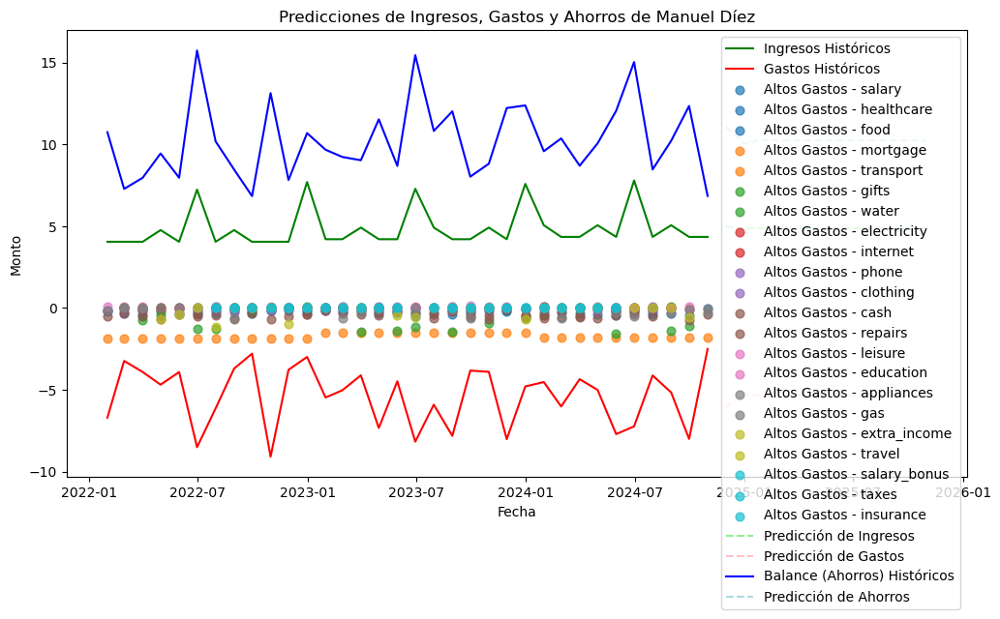

Datos de Agurtzane Laka:
         incomes   expenses
count  34.000000  34.000000
mean    2.686571  -2.858198
std     0.676221   1.014545
min     2.228292  -6.207127
25%     2.297139  -3.332802
50%     2.346301  -2.676196
75%     2.798885  -2.135781
max     4.535722  -1.060363
Número de datos para Agurtzane Laka: 34
     trx_date  income_forecast  expense_forecast  savings_forecast
34 2024-11-30         2.671277         -3.010650          5.681927
35 2024-12-31         2.702276         -2.836458          5.538733
36 2025-01-31         2.696840         -2.852016          5.548855
37 2025-02-28         2.697793         -2.850626          5.548419
38 2025-03-31         2.697626         -2.850750          5.548376
39 2025-04-30         2.697655         -2.850739          5.548394
40 2025-05-31         2.697650         -2.850740          5.548390
41 2025-06-30         2.697651         -2.850740          5.548391
42 2025-07-31         2.697651         -2.850740          5.548391
43 2025-08-31

C:\Users\User\AppData\Local\Temp\ipykernel_8012\4223777751.py:74: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  category_colors = plt.cm.get_cmap('tab10', len(expense_categories))  # Obtener un mapa de colores


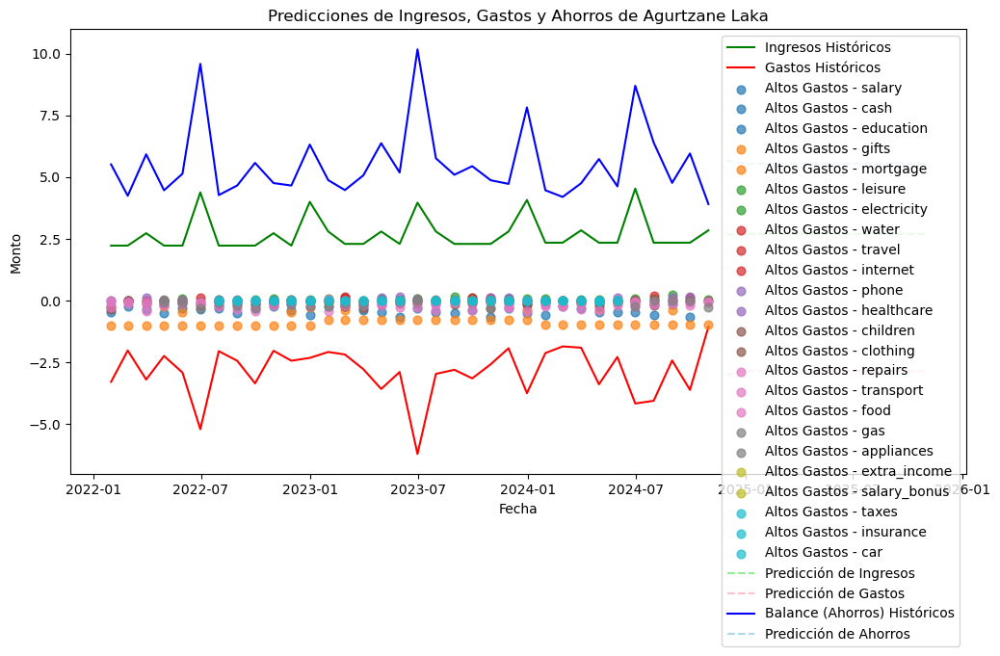

Datos de Patxi Urrutia:
         incomes   expenses
count  34.000000  34.000000
mean    4.202701  -4.720666
std     0.945647   1.235138
min     3.572797  -8.081171
25%     3.657133  -5.383819
50%     3.734036  -4.587820
75%     4.171671  -3.856780
max     6.526203  -2.557830
Número de datos para Patxi Urrutia: 34
     trx_date  income_forecast  expense_forecast  savings_forecast
34 2024-11-30         4.216892         -4.456779          8.673671
35 2024-12-31         4.220171         -4.671564          8.891735
36 2025-01-31         4.219832         -4.700159          8.919990
37 2025-02-28         4.219867         -4.703966          8.923832
38 2025-03-31         4.219863         -4.704472          8.924335
39 2025-04-30         4.219863         -4.704540          8.924403
40 2025-05-31         4.219863         -4.704549          8.924412
41 2025-06-30         4.219863         -4.704550          8.924413
42 2025-07-31         4.219863         -4.704550          8.924414
43 2025-08-31  

C:\Users\User\AppData\Local\Temp\ipykernel_8012\4223777751.py:74: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  category_colors = plt.cm.get_cmap('tab10', len(expense_categories))  # Obtener un mapa de colores


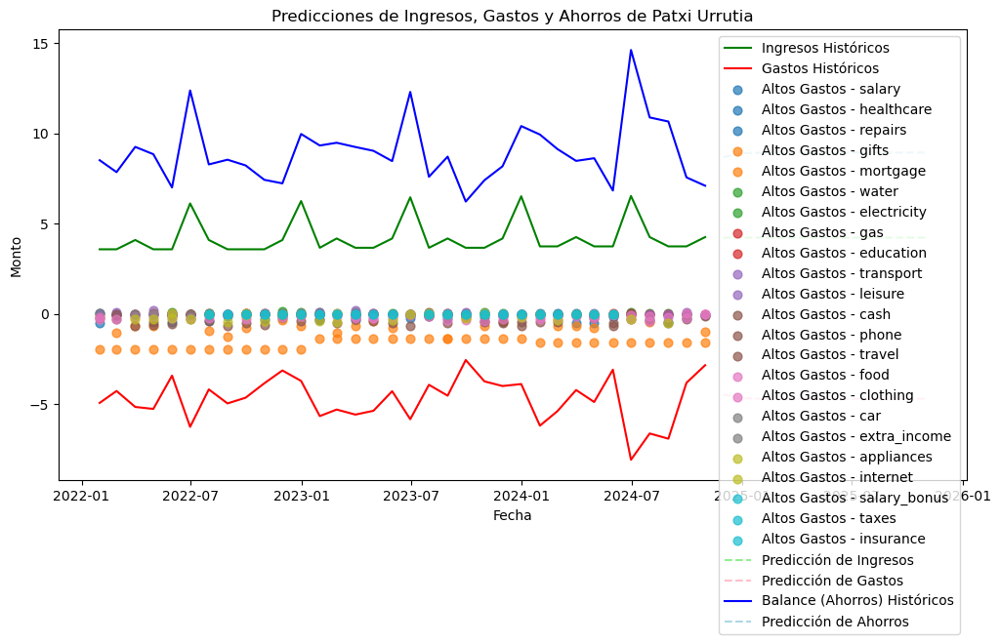

In [512]:
import pandas as pd
import numpy as np
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt

# Obtener los nombres y apellidos únicos. Iterar sobre cada uno
unique_persons = df[['name', 'surname']].drop_duplicates()
for index, person in unique_persons.iterrows():
    name, surname = person['name'], person['surname']
    
    # Filtrar los datos por 'name' y 'surname'
    person_df = df[(df['name'] == name) & (df['surname'] == surname)].copy()
    
    # Asegurarse de que la columna de fecha está en formato datetime
    person_df['trx_date'] = pd.to_datetime(person_df['trx_date'])
    
    # Crear columnas separadas para ingresos y gastos (usando 'trx_type' y 'trx_amount')
    person_df['incomes'] = person_df.apply(lambda x: x['trx_amount'] if x['trx_type'] == 'incomes' else 0, axis=1)
    person_df['expenses'] = person_df.apply(lambda x: x['trx_amount'] if x['trx_type'] == 'expenses' else 0, axis=1)
    
    # Convertir a periodo mensual usando 'trx_date' como índice
    person_df.set_index('trx_date', inplace=True)
    
    # Sumar ingresos y gastos mensuales
    monthly_person_df = person_df.resample('M').sum()
    monthly_person_df.fillna(0, inplace=True)
    
    # Crear un nuevo dfFrame solo con ingresos, gastos y balance
    monthly_person_df['balance'] = monthly_person_df['incomes'] - monthly_person_df['expenses']
    monthly_person_df.reset_index(inplace=True)
    
    # Verificar si hay suficientes datos y que no haya NaN
    print(f"Datos de {name} {surname}:")
    print(monthly_person_df[['incomes', 'expenses']].describe())
    monthly_person_df.dropna(subset=['incomes', 'expenses'], inplace=True)
    
    # Verificar la longitud de los datos
    print(f"Número de datos para {name} {surname}: {len(monthly_person_df['incomes'])}")
    
    if len(monthly_person_df['incomes']) > 0:
        # Ajustar un modelo ARIMA para ingresos
        model_income = ARIMA(monthly_person_df['incomes'], order=(1, 0, 0), enforce_stationarity=False, enforce_invertibility=False)
        model_income_fit = model_income.fit()

        # Hacer predicciones para los siguientes 12 meses
        income_forecast = model_income_fit.forecast(steps=12)

        # Ajustar un modelo ARIMA para gastos
        model_expense = ARIMA(monthly_person_df['expenses'], order=(1, 0, 0), enforce_stationarity=False, enforce_invertibility=False)
        model_expense_fit = model_expense.fit()

        # Hacer predicciones para los siguientes 12 meses
        expense_forecast = model_expense_fit.forecast(steps=12)

        # Crear un dfFrame para las predicciones
        forecast_index = pd.date_range(start=monthly_person_df['trx_date'].iloc[-1] + pd.DateOffset(months=1), periods=12, freq='M')
        forecast_df = pd.DataFrame({'trx_date': forecast_index, 'income_forecast': income_forecast, 'expense_forecast': expense_forecast})

        # Calcular ahorros (balance)
        forecast_df['savings_forecast'] = forecast_df['income_forecast'] - forecast_df['expense_forecast']

        # Mostrar las predicciones
        print(forecast_df)

        # Graficar las predicciones
        plt.figure(figsize=(12, 6))

        # Gráfica de ingresos y gastos históricos
        plt.plot(monthly_person_df['trx_date'], monthly_person_df['incomes'], label='Ingresos Históricos', color='green')
        plt.plot(monthly_person_df['trx_date'], monthly_person_df['expenses'], label='Gastos Históricos', color='red')

        # Calcular la media y el 80% de la media por cada categoría de gasto
        expense_categories = person_df['trx_cat'].unique()
        category_colors = plt.cm.get_cmap('tab10', len(expense_categories))  # Obtener un mapa de colores

        # Graficar puntos que superan el 80% de la media por categoría
        for i, cat in enumerate(expense_categories):
            cat_df = person_df[person_df['trx_cat'] == cat]
            monthly_cat_df = cat_df.resample('M').sum()
            cat_mean = monthly_cat_df['expenses'].mean()
            high_expense_threshold = cat_mean * 1.8
            
            # Identificar puntos que superan el 80% de la media de la categoría
            high_expense_points = monthly_cat_df[monthly_cat_df['expenses'] > high_expense_threshold]

            # Graficar puntos que superan el 80% de la media por categoría
            plt.scatter(high_expense_points.index, high_expense_points['expenses'], 
                        color=category_colors(i), label=f'Altos Gastos - {cat}', s=40, alpha=0.7, zorder=5)

        # Graficar predicciones de ingresos y gastos
        plt.plot(forecast_df['trx_date'], forecast_df['income_forecast'], label='Predicción de Ingresos', color='lightgreen', linestyle='--')
        plt.plot(forecast_df['trx_date'], forecast_df['expense_forecast'], label='Predicción de Gastos', color='pink', linestyle='--')

        # Graficar balance/ahorros históricos y predicción
        plt.plot(monthly_person_df['trx_date'], monthly_person_df['balance'], label='Balance (Ahorros) Históricos', color='blue')
        plt.plot(forecast_df['trx_date'], forecast_df['savings_forecast'], label='Predicción de Ahorros', color='lightblue', linestyle='--')

        plt.title(f'Predicciones de Ingresos, Gastos y Ahorros de {name} {surname}')
        plt.xlabel('Fecha')
        plt.ylabel('Monto')
        plt.legend()
        plt.show()
    else:
        print(f"No hay suficientes datos para ajustar el modelo ARIMA para {name} {surname}.")


## ¿Qué gasto es el más alto?

In [516]:
import pandas as pd

df['trx_date'] = pd.to_datetime(df['trx_date'])

expense_categories = ['leisure', 'cash', 'transport', 'food', 'rent', 'water', 'gifts', 'electricity', 
                      'phone', 'education', 'clothing', 'repairs', 'travel', 'appliances', 'car', 
                      'healthcare', 'gas', 'internet', 'taxes', 'insurance', 'mortgage', 'children']

# Filtrar por el último mes
last_month = df['trx_date'].max().to_period('M')
last_month_data = df[df['trx_date'].dt.to_period('M') == last_month]

# Filtrar solo los gastos
expenses_last_month = last_month_data[last_month_data['trx_type'] == 'expenses']

# Agrupar por categoría de gasto y sumar los montos
category_expense_sum = expenses_last_month.groupby('trx_cat')['trx_amount'].sum()

# Encontrar la categoría con el mayor gasto
max_expense_category = category_expense_sum.idxmax()
max_expense_amount = category_expense_sum.max()

print(f"La categoría con mayor gasto en el último mes fue '{max_expense_category}' con un total de {max_expense_amount:.2f}.")

print("\nGastos por categoría en el último mes:")
print(category_expense_sum.sort_values(ascending=False))


La categoría con mayor gasto en el último mes fue 'water' con un total de 0.12.

Gastos por categoría en el último mes:
trx_cat
water           0.115152
leisure         0.068399
phone           0.005529
education      -0.002883
healthcare     -0.062213
transport      -0.213142
gas            -0.239527
clothing       -0.245117
internet       -0.269860
electricity    -0.467619
appliances     -0.534062
food           -0.746754
cash           -0.893993
children       -1.124652
travel         -1.394505
repairs        -1.625448
rent           -1.849145
gifts          -4.704590
mortgage      -15.965468
Name: trx_amount, dtype: float64


### tabla categoría gasto

In [520]:
import pandas as pd

# Asegurarse de que 'trx_date' esté en formato datetime
data['trx_date'] = pd.to_datetime(data['trx_date'])

# Definir las categorías de gastos
categorias = [
    'transporte', 'comida', 'alquiler', 'agua', 'electricidad', 
    'reparaciones', 'teléfono', 'educación', 'coche', 
    'electrodomésticos', 'salud', 'gas', 'internet', 
    'impuestos', 'seguros', 'hipoteca', 'hijos', 
    'ocio', 'efectivo', 'regalos', 'ropa', 'viajes'
]

# Filtrar el DataFrame para que solo contenga las columnas necesarias
data_filtered = data[['name', 'surname', 'trx_date', 'trx_cat', 'trx_amount']]

# Crear la tabla pivotante
tabla_pivot = data_filtered.pivot_table(
    index=['name', 'surname', 'trx_date'], 
    columns='trx_cat', 
    values='trx_amount', 
    fill_value=0  # Rellenar con 0 si no hay gasto en esa categoría
)

# Restablecer el índice para que 'name', 'surname' y 'trx_date' sean columnas normales
tabla_final = tabla_pivot.reset_index()

# Verificar qué categorías están presentes en la tabla pivotante
categorias_presentes = tabla_final.columns.difference(['name', 'surname', 'trx_date']).tolist()
tabla_final = tabla_final[['name', 'surname', 'trx_date'] + categorias_presentes]
print(tabla_final)

trx_cat       name  surname            trx_date  appliances  car   cash  \
0        Agurtzane     Laka 2022-01-01 14:25:06         0.0  0.0 -100.0   
1        Agurtzane     Laka 2022-01-01 23:26:59         0.0  0.0    0.0   
2        Agurtzane     Laka 2022-01-02 12:30:19         0.0  0.0    0.0   
3        Agurtzane     Laka 2022-01-04 16:08:55         0.0  0.0    0.0   
4        Agurtzane     Laka 2022-01-05 09:11:02         0.0  0.0    0.0   
...            ...      ...                 ...         ...  ...    ...   
8888          Sara  Urkiaga 2024-10-08 11:39:38         0.0  0.0    0.0   
8889          Sara  Urkiaga 2024-10-08 19:06:12         0.0  0.0    0.0   
8890          Sara  Urkiaga 2024-10-09 11:37:48         0.0  0.0    0.0   
8891          Sara  Urkiaga 2024-10-09 12:37:41         0.0  0.0    0.0   
8892          Sara  Urkiaga 2024-10-11 13:33:27         0.0  0.0    0.0   

trx_cat  children  clothing  education  electricity  ...  rent  repairs  \
0             0.0       

In [521]:
import pandas as pd

# Asegurarse de que 'trx_date' esté en formato datetime
data['trx_date'] = pd.to_datetime(data['trx_date'])

# Definir las categorías de gastos que deseas filtrar
categorias_interes = [
    'transporte', 'comida', 'alquiler', 'agua', 'electricidad', 
    'reparaciones', 'teléfono', 'educación', 'coche', 
    'electrodomésticos', 'salud', 'gas', 'internet', 
    'impuestos', 'seguros', 'hipoteca', 'hijos', 
    'ocio', 'efectivo', 'regalos', 'ropa', 'viajes'
]

# Filtrar el DataFrame para incluir solo las categorías de interés
data_filtrada = data[data['trx_cat'].isin(categorias_interes)]

# Mostrar el DataFrame filtrado con todas las columnas que contienen trx_amount
print(data_filtrada[['name', 'surname', 'trx_date', 'trx_cat', 'trx_amount']])


       name  surname            trx_date   trx_cat  trx_amount
48    Aitor    López 2022-02-06 18:24:16       gas     -117.27
88    Aitor    López 2022-03-07 21:39:39       gas      -95.12
122   Aitor    López 2022-04-07 19:41:20       gas     -124.13
125   Aitor    López 2022-04-08 09:47:01       gas      -60.80
158   Aitor    López 2022-05-06 19:49:41       gas     -167.05
...     ...      ...                 ...       ...         ...
9045  Patxi  Urrutia 2024-09-07 20:56:51  internet      -49.89
9046  Patxi  Urrutia 2024-09-08 10:45:30       gas      -44.24
9047  Patxi  Urrutia 2024-09-08 12:20:16  internet      -49.89
9074  Patxi  Urrutia 2024-10-05 09:57:36       gas      -64.88
9078  Patxi  Urrutia 2024-10-07 18:58:55  internet      -49.89

[546 rows x 5 columns]


## Total en gastos

In [523]:
import pandas as pd

# Asegurarse de que 'trx_date' esté en formato datetime
data['trx_date'] = pd.to_datetime(data['trx_date'])

# Filtrar datos del último mes
ultimo_mes = data[data['trx_date'] >= (pd.Timestamp.now() - pd.DateOffset(months=1))]

# Filtrar para incluir solo gastos (valores negativos)
gastos = ultimo_mes[ultimo_mes['trx_amount'] < 0]

# Agrupar los gastos por categoría y sumar los montos
gastos_por_categoria = gastos.groupby('trx_cat')['trx_amount'].sum().abs()

# Encontrar la categoría con mayor gasto
categoria_max_gasto = gastos_por_categoria.idxmax()
total_max_gasto = gastos_por_categoria.max()

print(f"La categoría con mayor gasto en el último mes fue '{categoria_max_gasto}' con un total de {total_max_gasto:.2f}.")

print("\nGastos por categoría en el último mes:")
print(gastos_por_categoria)


La categoría con mayor gasto en el último mes fue 'mortgage' con un total de 9863.54.

Gastos por categoría en el último mes:
trx_cat
appliances     1818.090000
cash           3300.000000
children       1341.135333
clothing        948.170000
education       474.690000
electricity     556.440000
food           3265.550000
gas             476.900000
gifts          6712.670000
healthcare     1020.540000
internet        773.880000
leisure        1493.170000
mortgage       9863.540000
phone           777.870000
rent           1152.970000
repairs        2654.830000
transport      1979.610000
travel         2004.500000
water           489.640000
Name: trx_amount, dtype: float64


## Persona por gastado tabla

In [524]:
import pandas as pd

# Asegurarse de que 'trx_date' esté en formato datetime
data['trx_date'] = pd.to_datetime(data['trx_date'])

# Filtrar datos del último mes
ultimo_mes = data[data['trx_date'] >= (pd.Timestamp.now() - pd.DateOffset(months=1))]

# Filtrar para incluir solo gastos (valores negativos)
gastos = ultimo_mes[ultimo_mes['trx_amount'] < 0]

# Agrupar los gastos por 'name', 'surname' y 'trx_cat', y sumar los montos
gastos_por_persona_categoria = gastos.groupby(['name', 'surname', 'trx_cat'])['trx_amount'].sum().abs().reset_index()

# Pivotar el DataFrame para que cada persona tenga su propia columna
gastos_pivot = gastos_por_persona_categoria.pivot_table(index='trx_cat', columns=['name', 'surname'], values='trx_amount', fill_value=0)

print("\nGastos por categoría y persona en el último mes (columnas separadas por persona):")
print(gastos_pivot)



Gastos por categoría y persona en el último mes (columnas separadas por persona):
name          Agurtzane    Aitor Aitxiber        Ana   Manuel      Marc  \
surname            Laka    López   Beitia Etxebarria     Díez    Andreu   
trx_cat                                                                   
appliances   282.410000     0.00     0.00     247.37  1288.31     0.000   
cash         300.000000   800.00   300.00     300.00   200.00   400.000   
children      51.958333     0.00     0.00       0.00     0.00  1289.177   
clothing      97.530000   162.85    51.34       0.00    97.41   316.230   
education     75.850000    68.46   100.64       0.00     0.00   180.820   
electricity   53.970000   114.64     0.00     210.08     0.00    87.780   
food         599.580000   439.49   471.90     203.57   422.75   492.490   
gas           62.140000     0.00   132.97     126.88    90.03     0.000   
gifts        147.800000   292.78   966.07     678.83   274.50  1268.830   
healthcare   311.

In [456]:
'''import pandas as pd

# Asegurarse de que 'trx_date' esté en formato datetime
data['trx_date'] = pd.to_datetime(data['trx_date'])

# Filtrar datos del último mes
ultimo_mes = data[data['trx_date'] >= (pd.Timestamp.now() - pd.DateOffset(months=1))]

# Filtrar para incluir solo gastos (valores negativos)
gastos = ultimo_mes[ultimo_mes['trx_amount'] < 0]

# Agrupar los gastos por 'name', 'surname' y 'trx_cat', y sumar los montos
gastos_por_persona_categoria = gastos.groupby(['name', 'surname', 'trx_cat'])['trx_amount'].sum().abs().reset_index()

# Pivotar la tabla para que 'trx_cat' se convierta en columnas
gastos_pivot = gastos_por_persona_categoria.pivot_table(index=['name', 'surname'], columns='trx_cat', values='trx_amount', fill_value=0)

# Obtener el total de gastos por 'name' y 'surname' (sin separar por categoría)
total_gastos_por_persona = gastos.groupby(['name', 'surname'])['trx_amount'].sum().abs().reset_index()

# Añadir una columna de total en la tabla pivotada
gastos_pivot['Total'] = gastos_pivot.sum(axis=1)

# Mostrar resultados
print("\nGastos por persona y categoría en el último mes (detallado):")
print(gastos_pivot)

print("\nTotal de gastos por persona en el último mes:")
print(total_gastos_por_persona)
'''


Gastos por persona y categoría en el último mes (detallado):
trx_cat               appliances   cash     children  clothing  education  \
name      surname                                                           
Agurtzane Laka            282.41  300.0    51.958333     97.53      75.85   
Aitor     López             0.00  800.0     0.000000    162.85      68.46   
Aitxiber  Beitia            0.00  300.0     0.000000     51.34     100.64   
Ana       Etxebarria      247.37  300.0     0.000000      0.00       0.00   
Manuel    Díez           1288.31  200.0     0.000000     97.41       0.00   
Marc      Andreu            0.00  400.0  1289.177000    316.23     180.82   
Patxi     Urrutia           0.00  500.0     0.000000    114.65      48.92   
Sara      Urkiaga           0.00  600.0     0.000000    108.16       0.00   

trx_cat               electricity    food     gas    gifts  healthcare  \
name      surname                                                        
Agurtzane Laka     

## Gráficas de queso para ver los gastos más altos

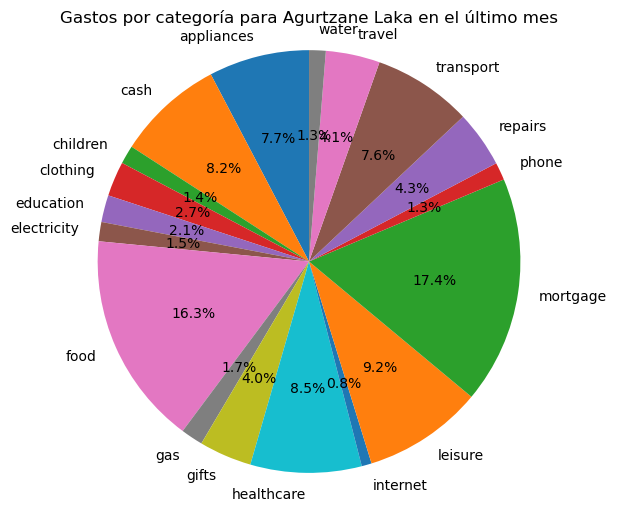

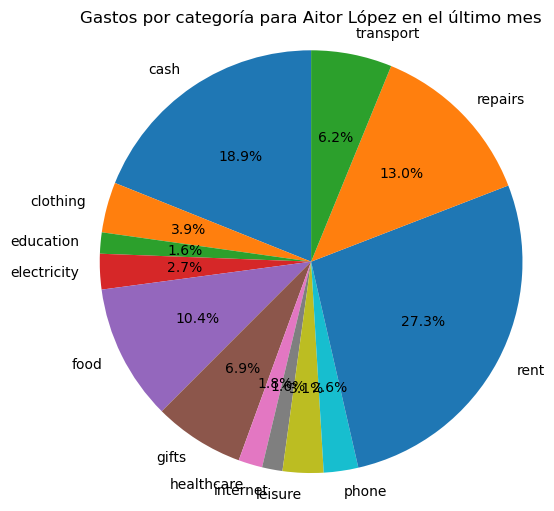

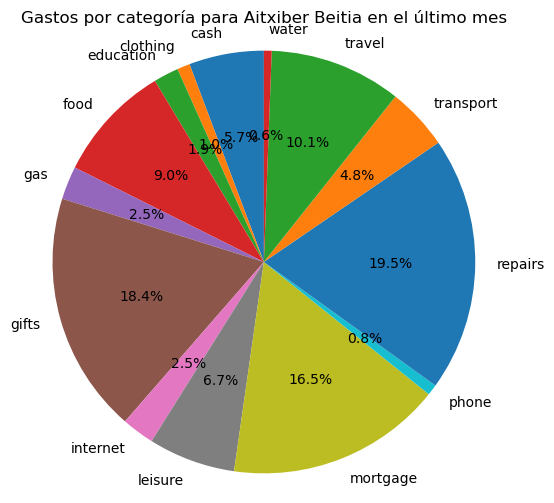

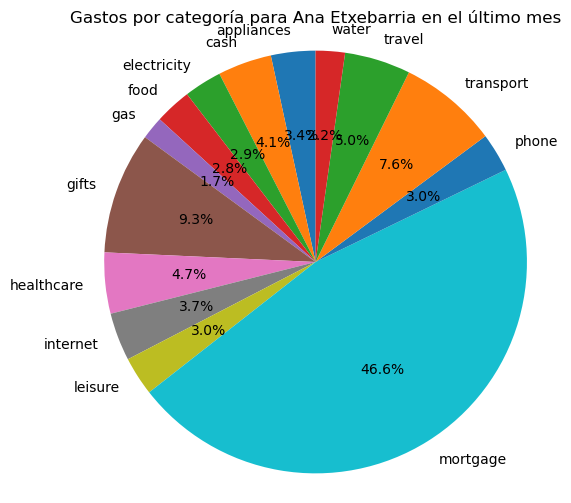

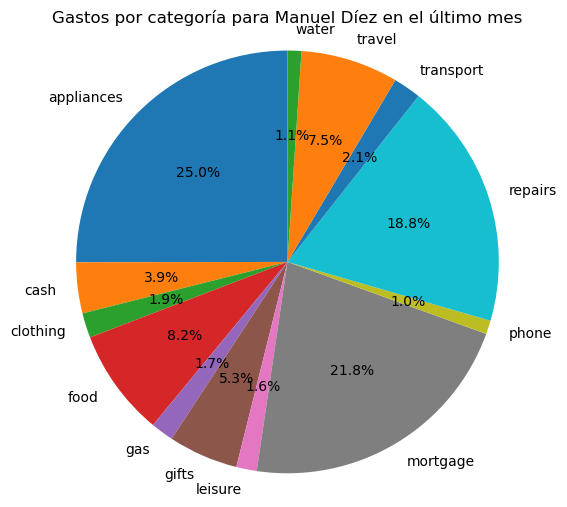

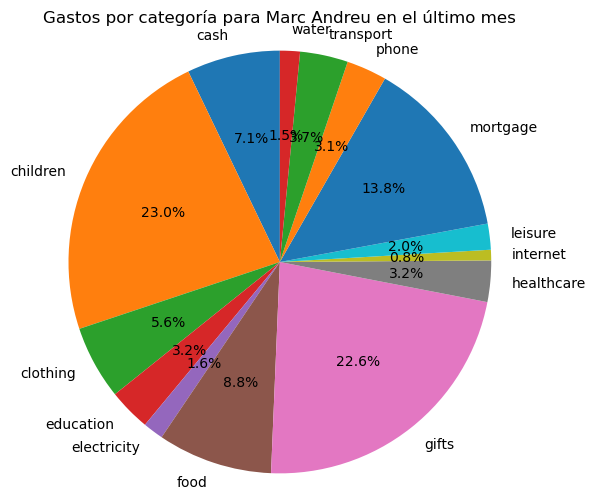

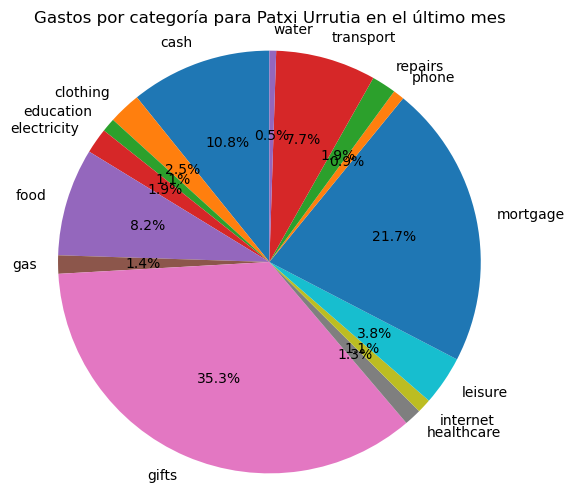

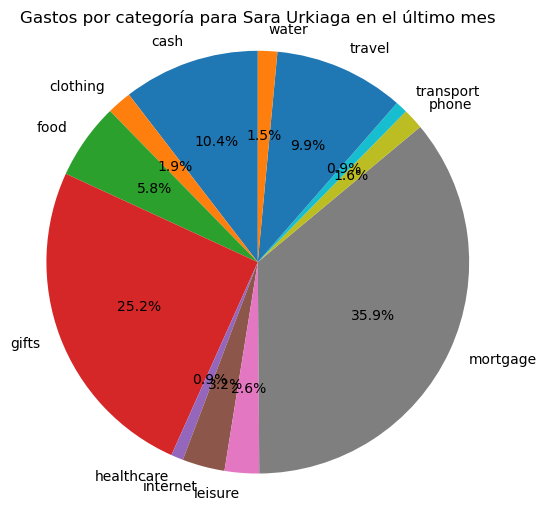

In [459]:
import pandas as pd
import matplotlib.pyplot as plt

# Asegurarse de que 'trx_date' esté en formato datetime
data['trx_date'] = pd.to_datetime(data['trx_date'])

# Filtrar datos del último mes
ultimo_mes = data[data['trx_date'] >= (pd.Timestamp.now() - pd.DateOffset(months=1))]

# Filtrar para incluir solo gastos (valores negativos)
gastos = ultimo_mes[ultimo_mes['trx_amount'] < 0]

# Agrupar los gastos por 'name', 'surname' y 'trx_cat', y sumar los montos
gastos_por_persona_categoria = gastos.groupby(['name', 'surname', 'trx_cat'])['trx_amount'].sum().abs().reset_index()

# Pivotar el DataFrame para que cada persona tenga su propia columna
gastos_pivot = gastos_por_persona_categoria.pivot_table(index='trx_cat', columns=['name', 'surname'], values='trx_amount', fill_value=0)

# Generar gráficos de torta para cada persona
for persona in gastos_pivot.columns:
    # Obtener el nombre completo de la persona (nombre y apellido)
    nombre_completo = f"{persona[0]} {persona[1]}"
    
    # Obtener los gastos de esta persona por categoría
    gastos_persona = gastos_pivot[persona]
    
    # Filtrar solo las categorías en las que se ha gastado dinero
    gastos_persona = gastos_persona[gastos_persona > 0]
    
    plt.figure(figsize=(6, 6))
    plt.pie(gastos_persona, labels=gastos_persona.index, autopct='%1.1f%%', startangle=90)
    plt.title(f'Gastos por categoría para {nombre_completo} en el último mes')
    plt.axis('equal')
    
    plt.show()


# Grafico de torta necesidades y otros

In [525]:
'''import pandas as pd
import matplotlib.pyplot as plt

# Asegurarse de que 'trx_date' esté en formato datetime
data['trx_date'] = pd.to_datetime(data['trx_date'])

# Filtrar datos del último mes
ultimo_mes = data[data['trx_date'] >= (pd.Timestamp.now() - pd.DateOffset(months=1))]

# Filtrar para incluir solo gastos (valores negativos)
gastos = ultimo_mes[ultimo_mes['trx_amount'] < 0]

# Agrupar los gastos por 'name', 'surname' y 'trx_cat', y sumar los montos en valor absoluto
gastos_por_persona_categoria = gastos.groupby(['name', 'surname', 'trx_cat'])['trx_amount'].sum().abs().reset_index()

# Pivotar el DataFrame para que cada persona tenga su propia columna
gastos_pivot = gastos_por_persona_categoria.pivot_table(index='trx_cat', columns=['name', 'surname'], values='trx_amount', fill_value=0)

# Definir las categorías de necesidades y otras
necesidades = ['transporte', 'comida', 'alquiler', 'agua', 'electricidad', 'reparaciones', 
               'teléfono', 'educación', 'coche', 'electrodomésticos', 'salud', 'gas', 
               'internet', 'impuestos', 'seguros', 'hipoteca', 'hijos']

otras = ['ocio', 'efectivo', 'regalos', 'ropa', 'viajes']

# Generar gráficos de torta para cada persona
for persona in gastos_pivot.columns:
    # Obtener el nombre completo de la persona (nombre y apellido)
    nombre_completo = f"{persona[0]} {persona[1]}"
    
    # Obtener los gastos de esta persona por categoría en valor absoluto
    gastos_persona = gastos_pivot[persona].abs()
    
    # Filtrar solo las categorías en las que se ha gastado dinero
    gastos_persona = gastos_persona[gastos_persona > 0]
    
    # Separar los gastos en necesidades y otras
    gastos_necesidades = gastos_persona[gastos_persona.index.isin(necesidades)]
    gastos_otras = gastos_persona[gastos_persona.index.isin(otras)]
    
    # Crear gráfico de torta para necesidades
    if not gastos_necesidades.empty:
        plt.figure(figsize=(6, 6))
        plt.pie(gastos_necesidades, labels=gastos_necesidades.index, autopct='%1.1f%%', startangle=90)
        plt.title(f'Gastos en necesidades para {nombre_completo}')
        plt.axis('equal')  # Asegura que el gráfico sea circular
        plt.show()
    
    # Crear gráfico de torta para otras
    if not gastos_otras.empty:
        plt.figure(figsize=(6, 6))
        plt.pie(gastos_otras, labels=gastos_otras.index, autopct='%1.1f%%', startangle=90)
        plt.title(f'Gastos en otras para {nombre_completo}')
        plt.axis('equal')  # Asegura que el gráfico sea circular
        plt.show()
'''

'import pandas as pd\nimport matplotlib.pyplot as plt\n\n# Asegurarse de que \'trx_date\' esté en formato datetime\ndata[\'trx_date\'] = pd.to_datetime(data[\'trx_date\'])\n\n# Filtrar datos del último mes\nultimo_mes = data[data[\'trx_date\'] >= (pd.Timestamp.now() - pd.DateOffset(months=1))]\n\n# Filtrar para incluir solo gastos (valores negativos)\ngastos = ultimo_mes[ultimo_mes[\'trx_amount\'] < 0]\n\n# Agrupar los gastos por \'name\', \'surname\' y \'trx_cat\', y sumar los montos en valor absoluto\ngastos_por_persona_categoria = gastos.groupby([\'name\', \'surname\', \'trx_cat\'])[\'trx_amount\'].sum().abs().reset_index()\n\n# Pivotar el DataFrame para que cada persona tenga su propia columna\ngastos_pivot = gastos_por_persona_categoria.pivot_table(index=\'trx_cat\', columns=[\'name\', \'surname\'], values=\'trx_amount\', fill_value=0)\n\n# Definir las categorías de necesidades y otras\nnecesidades = [\'transporte\', \'comida\', \'alquiler\', \'agua\', \'electricidad\', \'reparaci